In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 

In [2]:
df = pd.read_csv("/Users/USER/Downloads/data.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209 entries, 0 to 208
Data columns (total 80 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   wk_strt_dt                209 non-null    object 
 1   yr_nbr                    209 non-null    int64  
 2   qtr_nbr                   209 non-null    int64  
 3   prd                       209 non-null    int64  
 4   wk_nbr                    209 non-null    int64  
 5   wk_in_yr_nbr              209 non-null    int64  
 6   mdip_dm                   209 non-null    int64  
 7   mdip_inst                 209 non-null    int64  
 8   mdip_nsp                  209 non-null    int64  
 9   mdip_auddig               209 non-null    int64  
 10  mdip_audtr                209 non-null    int64  
 11  mdip_vidtr                209 non-null    int64  
 12  mdip_viddig               209 non-null    int64  
 13  mdip_so                   209 non-null    int64  
 14  mdip_on   

In [7]:
null_count = df.isna().sum()
null_count

wk_strt_dt      0
yr_nbr          0
qtr_nbr         0
prd             0
wk_nbr          0
               ..
seas_week_44    0
seas_week_45    0
seas_week_46    0
seas_week_47    0
seas_week_48    0
Length: 80, dtype: int64

In [8]:
df.isna().sum().sum()

0

In [9]:
df.describe()

,yr_nbr,qtr_nbr,prd,wk_nbr,wk_in_yr_nbr,mdip_dm,mdip_inst,mdip_nsp,mdip_auddig,mdip_audtr,...,seas_prd_12,seas_week_40,seas_week_41,seas_week_42,seas_week_43,seas_week_44,seas_week_45,seas_week_46,seas_week_47,seas_week_48
count,209.000000,209.000000,209.000000,209.000000,209.000000,2.090000e+02,2.090000e+02,2.090000e+02,2.090000e+02,2.090000e+02,...,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000,209.000000
mean,2016.004785,2.507177,6.526316,2.703349,26.626794,9.544510e+06,1.247717e+07,1.616957e+06,1.002816e+06,2.295103e+07,...,0.081340,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139,0.019139
std,1.226697,1.122838,3.465562,1.274015,15.119856,8.293082e+06,1.024959e+07,2.203341e+06,8.122848e+05,1.567124e+07,...,0.274012,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342,0.137342
min,2014.000000,1.000000,1.000000,1.000000,1.000000,0.000000e+00,4.853300e+04,0.000000e+00,1.561800e+04,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2015.000000,2.000000,4.000000,2.000000,14.000000,2.087021e+06,5.304240e+06,2.542340e+05,4.577220e+05,1.236705e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2016.000000,3.000000,7.000000,3.000000,27.000000,7.664954e+06,8.911466e+06,8.870720e+05,8.061170e+05,1.910160e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2017.000000,4.000000,10.000000,4.000000,40.000000,1.533852e+07,1.786920e+07,2.248483e+06,1.344765e+06,2.956004e+07,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2018.000000,4.000000,12.000000,5.000000,53.000000,3.979871e+07,6.545146e+07,1.553181e+07,5.418819e+06,9.066538e+07,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


**Exploratory Data Analysis**

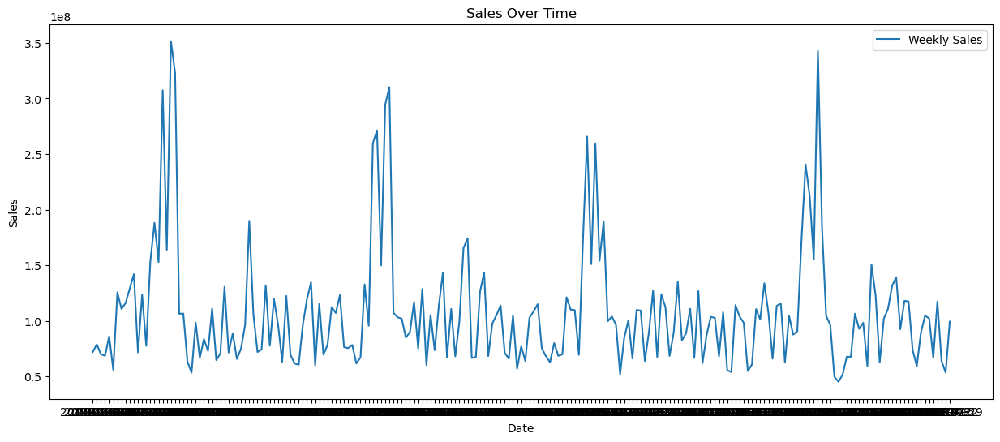

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 6))
plt.plot(df['wk_strt_dt'], df['sales'], label='Weekly Sales')
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.legend()
plt.show()


/var/folders/mr/4w3lkmc569gb6d_f2kbs910r0000gn/T/ipykernel_62809/1899425507.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


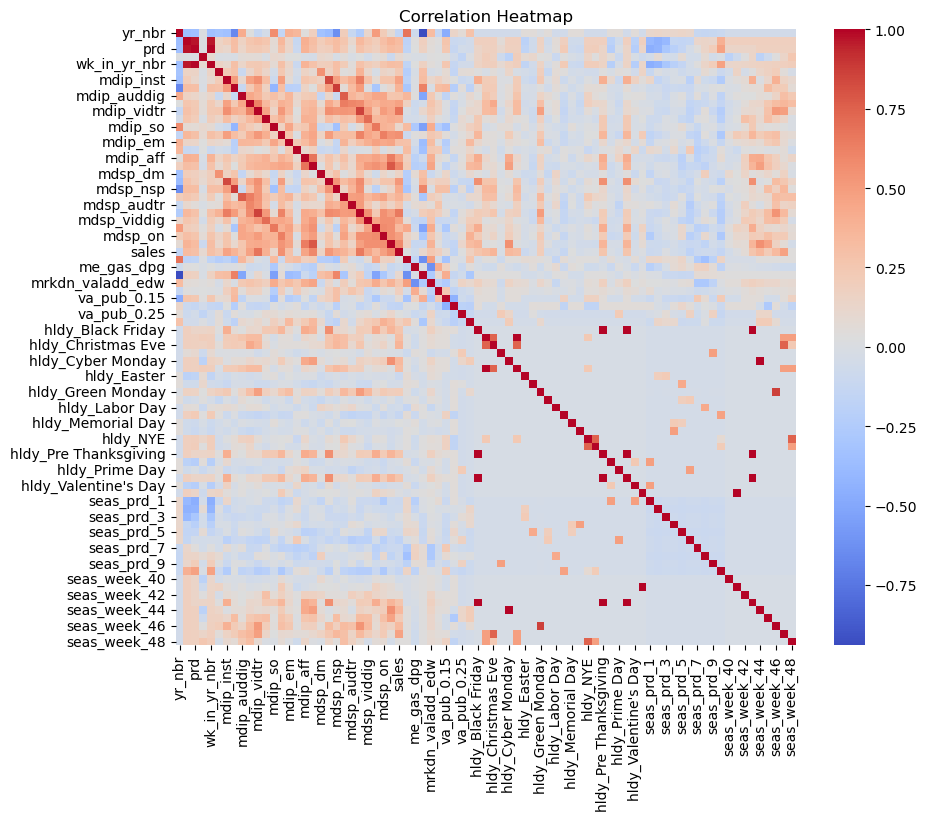

In [12]:
correlation_matrix = df.corr()
sales_correlations = correlation_matrix['sales'].sort_values(ascending=False)

import seaborn as sns

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


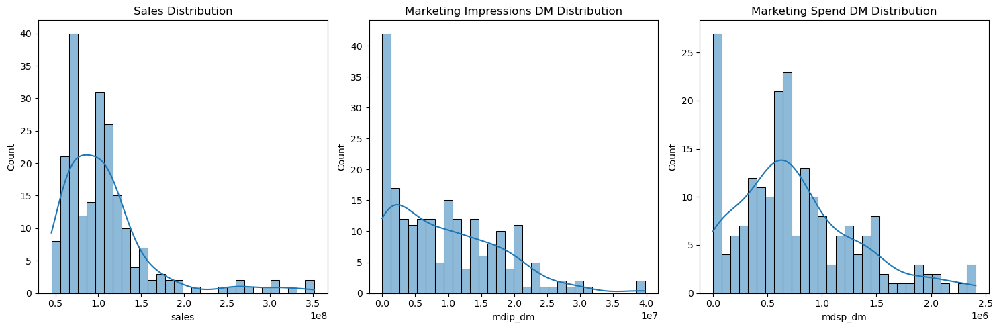

In [21]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.histplot(df['sales'], bins=30, kde=True)
plt.title('Sales Distribution')

plt.subplot(1, 3, 2)
sns.histplot(df['mdip_dm'], bins=30, kde=True) 
plt.title('Marketing Impressions DM Distribution')

plt.subplot(1, 3, 3)
sns.histplot(df['mdsp_dm'], bins=30, kde=True)  
plt.title('Marketing Spend DM Distribution')

plt.tight_layout()
plt.show()


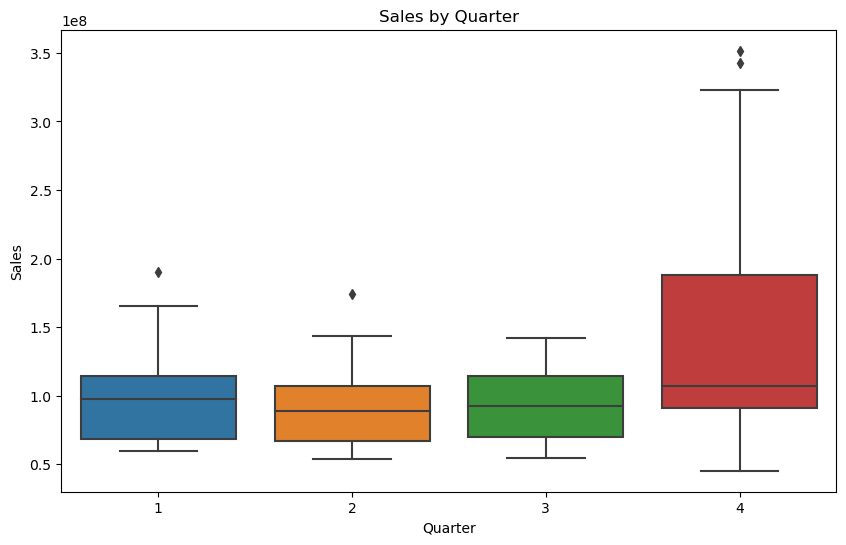

In [16]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='qtr_nbr', y='sales', data=df)
plt.title('Sales by Quarter')
plt.xlabel('Quarter')
plt.ylabel('Sales')
plt.show()


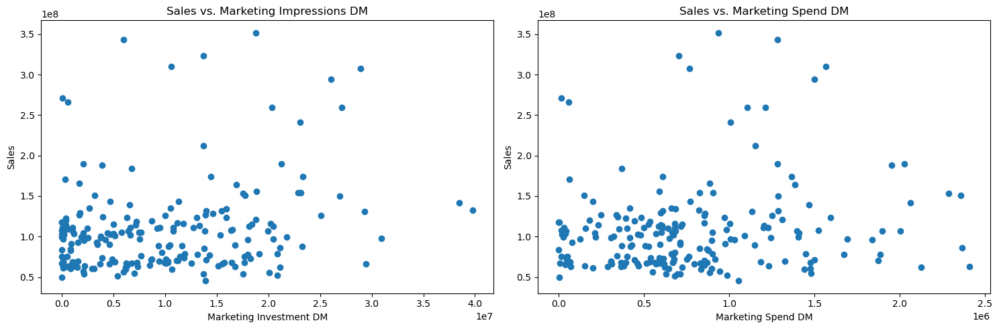

In [22]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.scatter(df['mdip_dm'], df['sales'])
plt.title('Sales vs. Marketing Impressions DM')
plt.xlabel('Marketing Investment DM')
plt.ylabel('Sales')

plt.subplot(1, 2, 2)
plt.scatter(df['mdsp_dm'], df['sales'])
plt.title('Sales vs. Marketing Spend DM')
plt.xlabel('Marketing Spend DM')
plt.ylabel('Sales')

plt.tight_layout()
plt.show()


In [19]:
correlation_with_sales = df.corrwith(df['sales']).sort_values(ascending=False)
print(correlation_with_sales)


sales          1.000000
mdip_vidtr     0.680728
mdsp_vidtr     0.656737
mdip_sem       0.590723
mdsp_sem       0.586409
                 ...   
hldy_MLK      -0.122840
seas_prd_12   -0.144258
yr_nbr        -0.145129
va_pub_0.2    -0.153508
seas_prd_6    -0.172208
Length: 79, dtype: float64


/var/folders/mr/4w3lkmc569gb6d_f2kbs910r0000gn/T/ipykernel_62809/167900221.py:2: FutureWarning: The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_sales = df.corrwith(df['sales']).sort_values(ascending=False)


<Axes: title={'center': 'Media Impressions Over Time'}, xlabel='wk_strt_dt'>

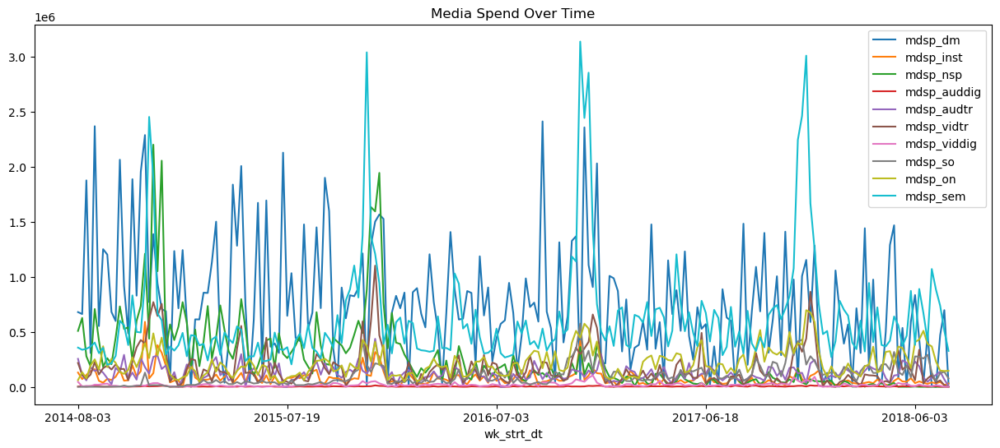

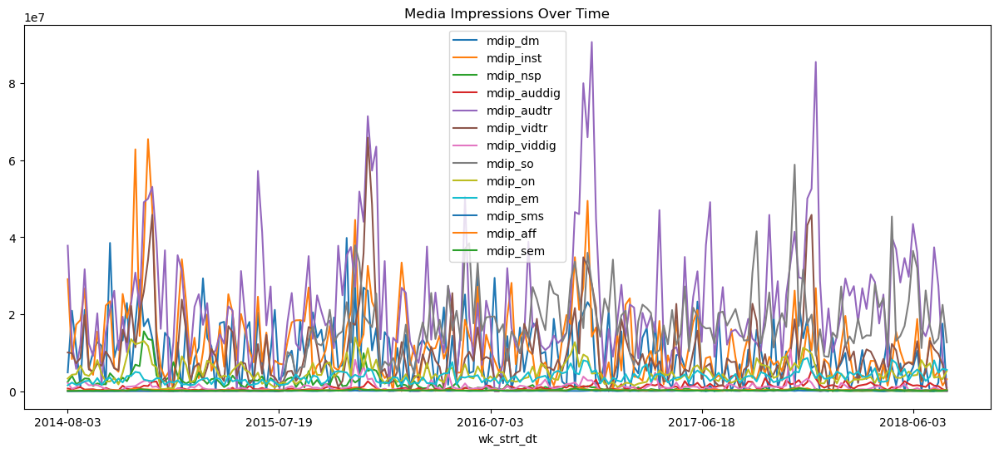

In [23]:
media_channels_spend = [col for col in df.columns if col.startswith('mdsp_')]
media_channels_impressions = [col for col in df.columns if col.startswith('mdip_')]

# Plotting for Media Spend Over Time
df.plot(x='wk_strt_dt', y=media_channels_spend, figsize=(15, 6), title='Media Spend Over Time')

# Plotting for Media Impressions Over Time
df.plot(x='wk_strt_dt', y=media_channels_impressions, figsize=(15, 6), title='Media Impressions Over Time')


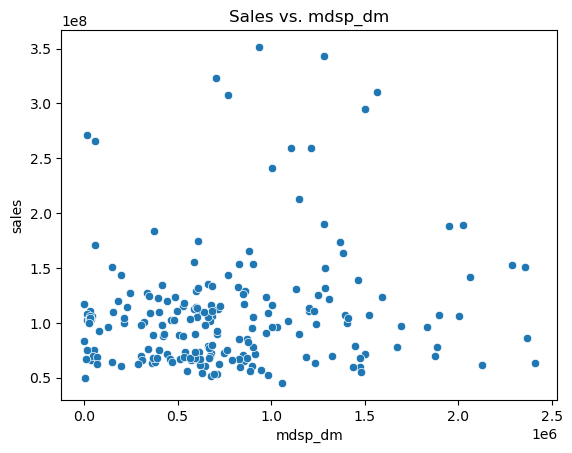

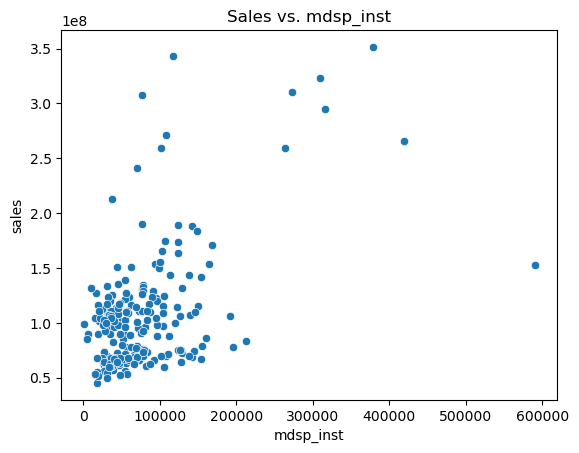

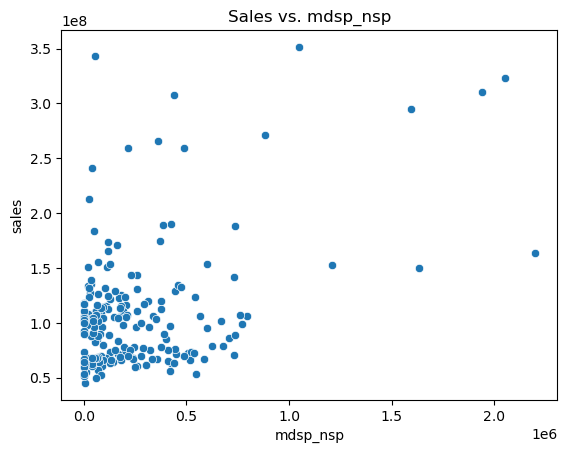

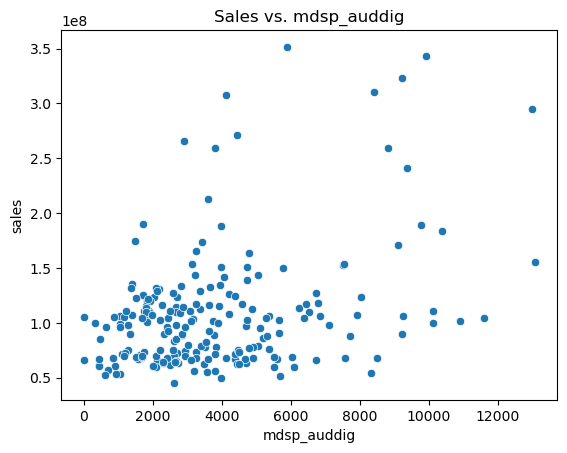

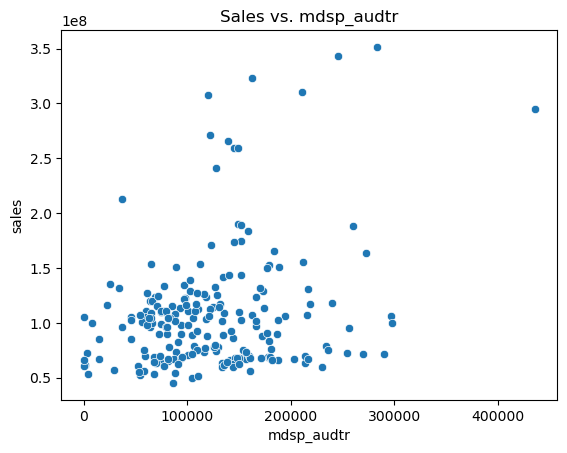

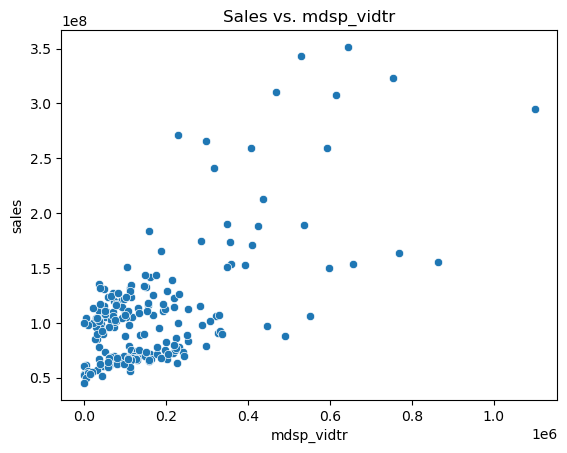

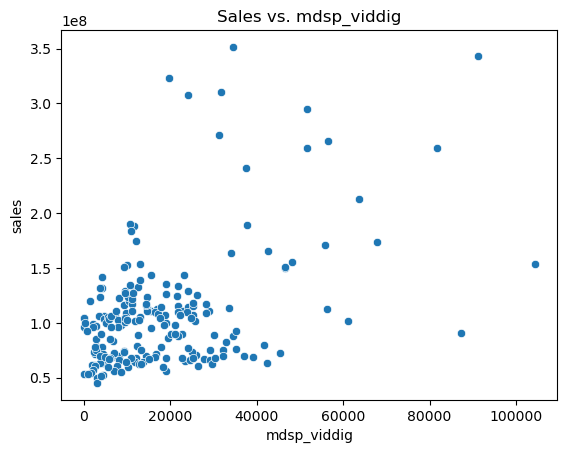

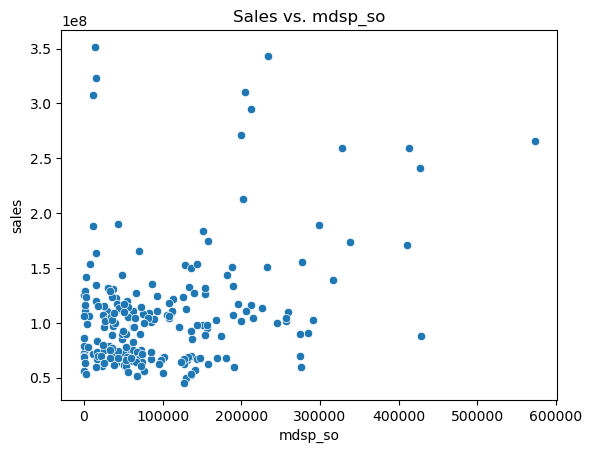

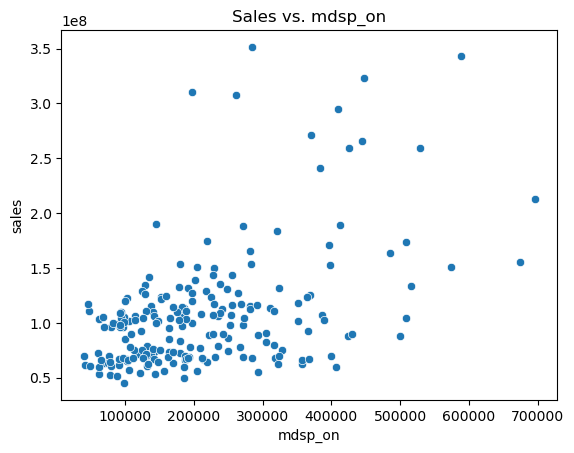

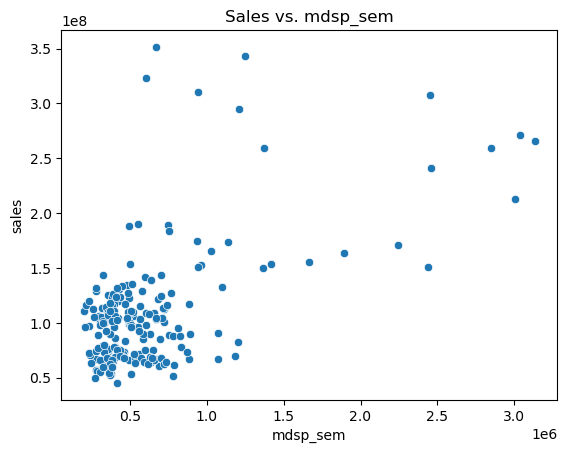

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

for channel in media_channels_spend:
    sns.scatterplot(data=df, x=channel, y='sales')
    plt.title(f'Sales vs. {channel}')
    plt.show()


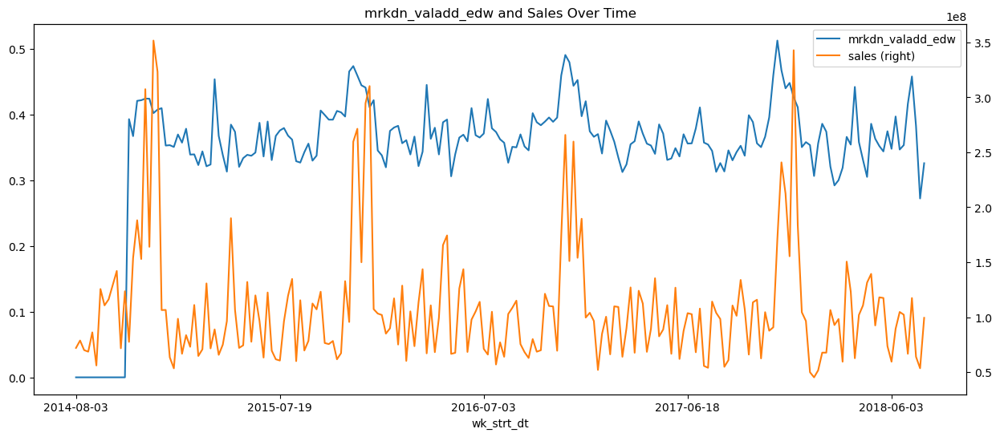

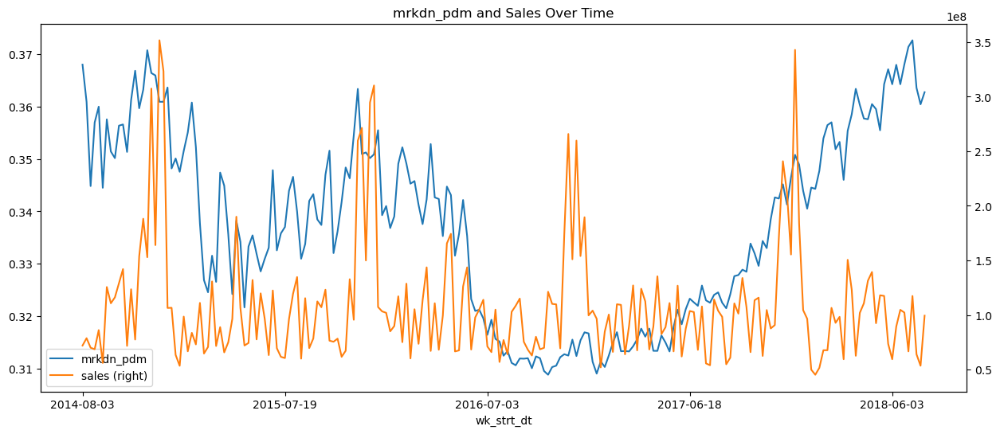

In [25]:

promo_discount_cols = [col for col in df.columns if 'promo' in col or col.startswith('mrkdn_')]

for col in promo_discount_cols:
    df.plot(x='wk_strt_dt', y=[col, 'sales'], secondary_y='sales', figsize=(15, 6), title=f'{col} and Sales Over Time')


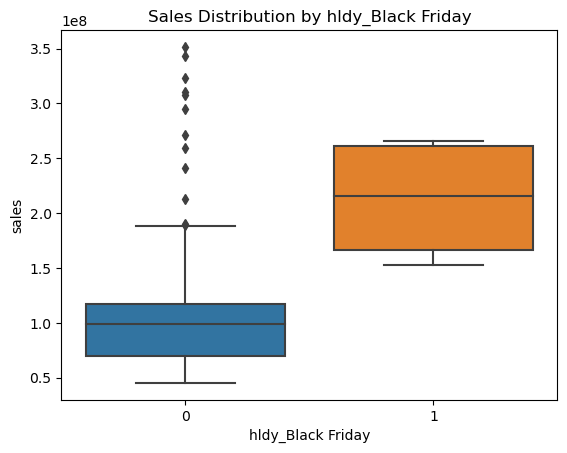

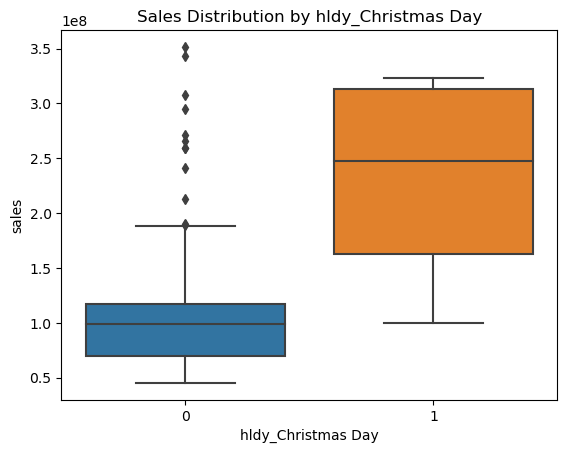

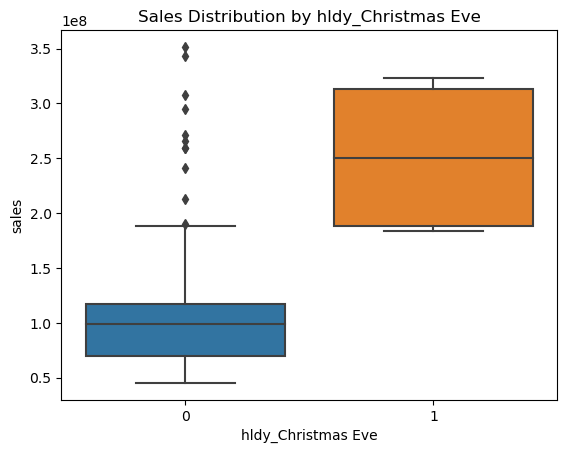

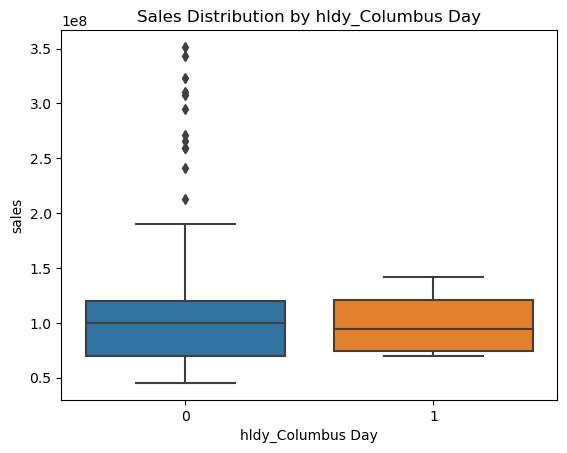

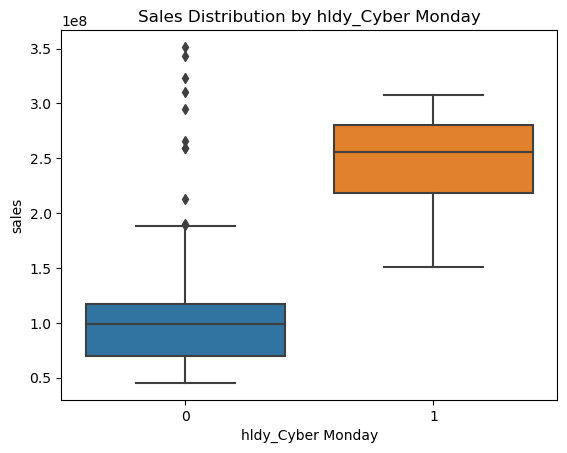

...

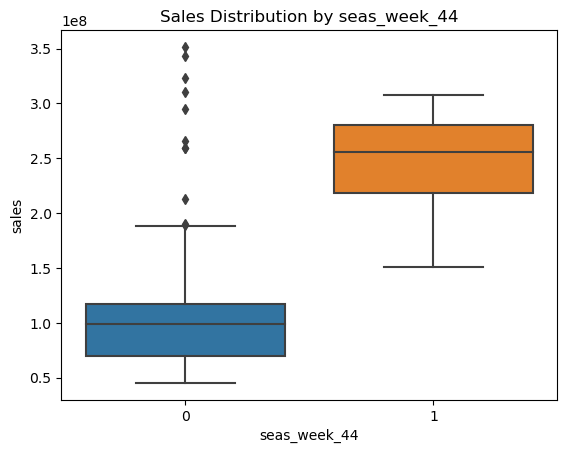

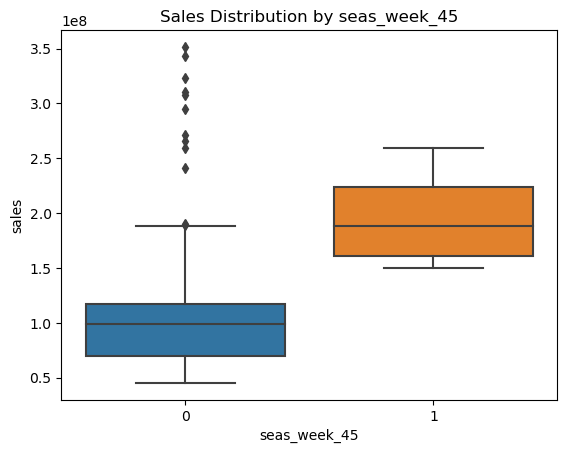

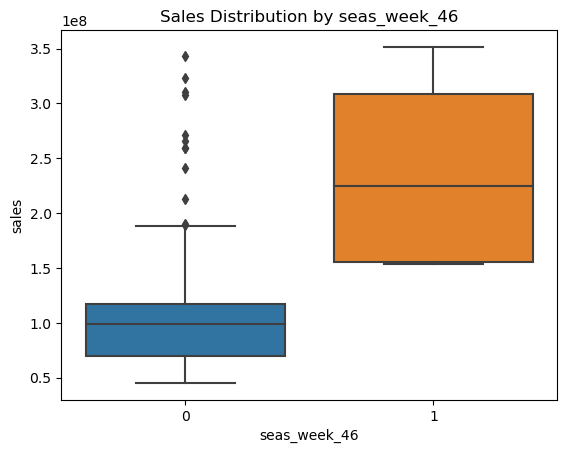

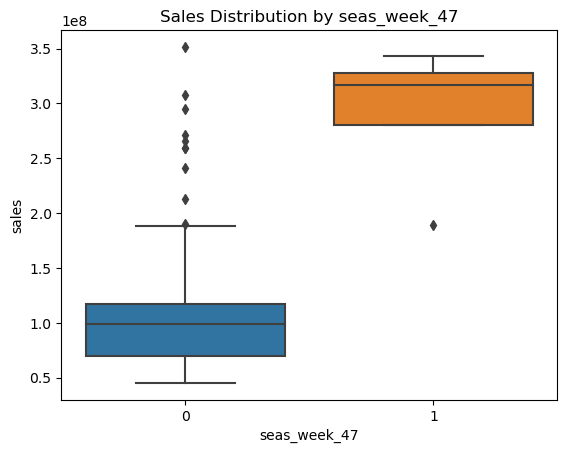

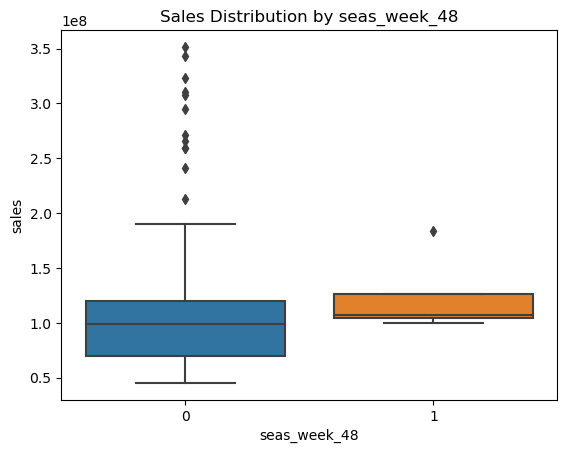

In [26]:
season_holiday_cols = [col for col in df.columns if col.startswith('seas_') or col.startswith('hldy_')]

for col in season_holiday_cols:
    sns.boxplot(data=df, x=col, y='sales')
    plt.title(f'Sales Distribution by {col}')
    plt.show()


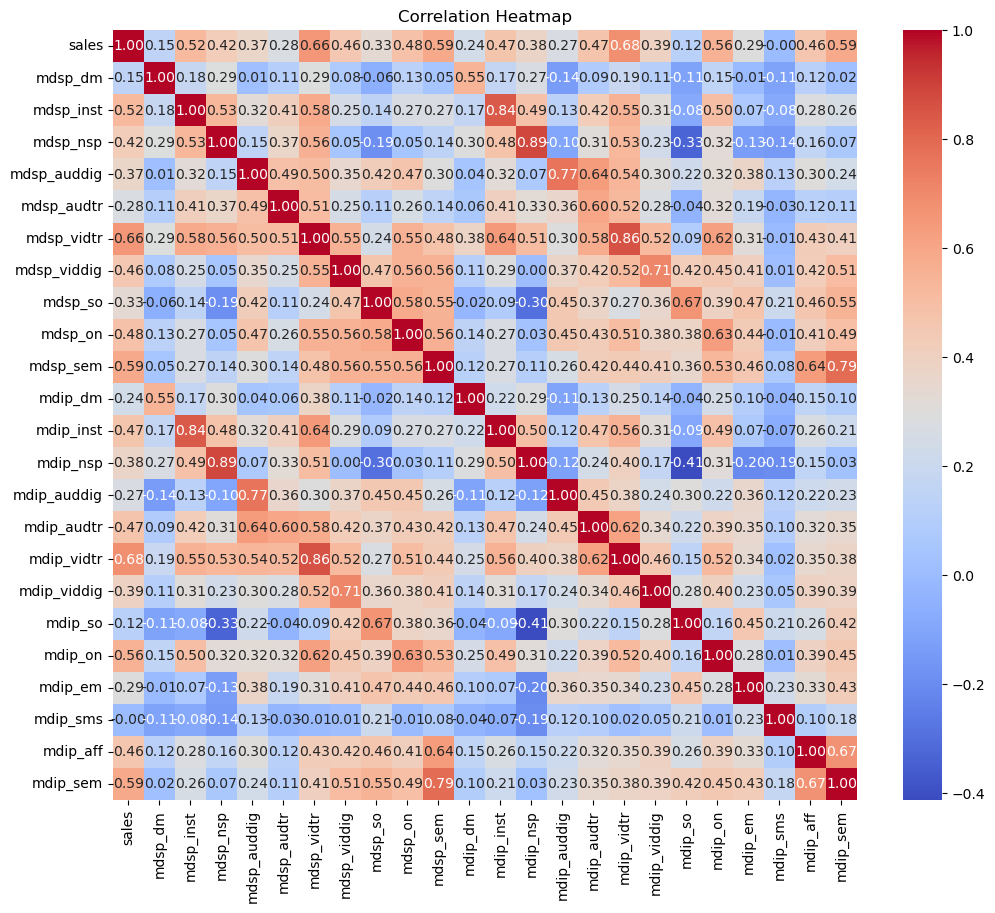

In [27]:
focus_cols = ['sales'] + media_channels_spend + media_channels_impressions
correlation_matrix = df[focus_cols].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


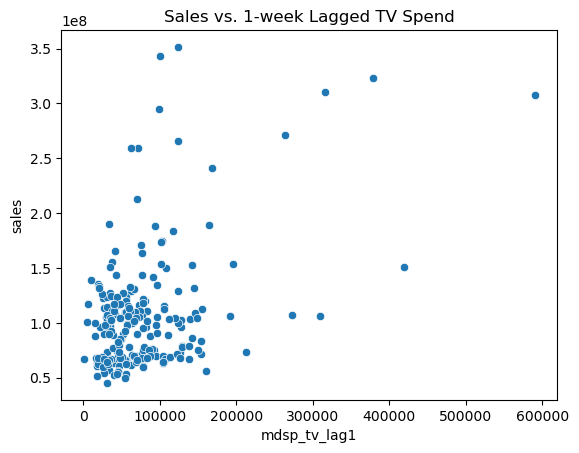

In [29]:
1-week lag effect for a single channel
df['mdsp_tv_lag1'] = df['mdsp_inst'].shift(1)

sns.scatterplot(data=df, x='mdsp_tv_lag1', y='sales')
plt.title('Sales vs. 1-week Lagged TV Spend')
plt.show()


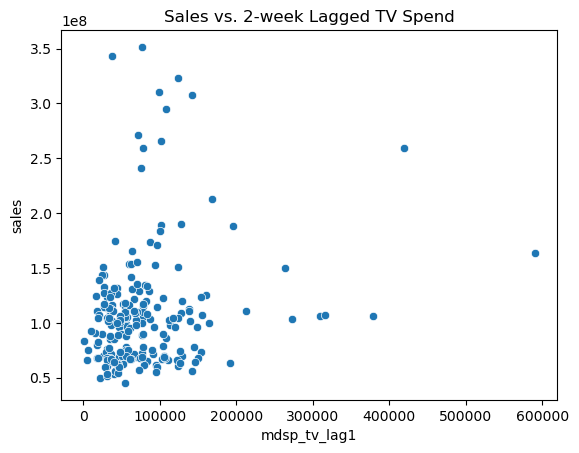

In [32]:
#2-week lag effect for a single channel
df['mdsp_tv_lag1'] = df['mdsp_inst'].shift(2)

sns.scatterplot(data=df, x='mdsp_tv_lag1', y='sales')
plt.title('Sales vs. 2-week Lagged TV Spend')
plt.show()

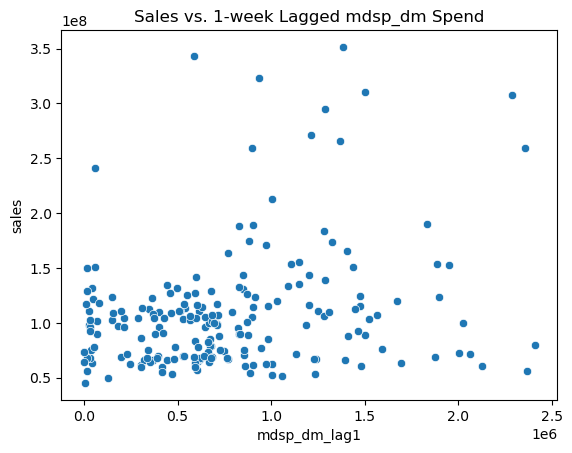

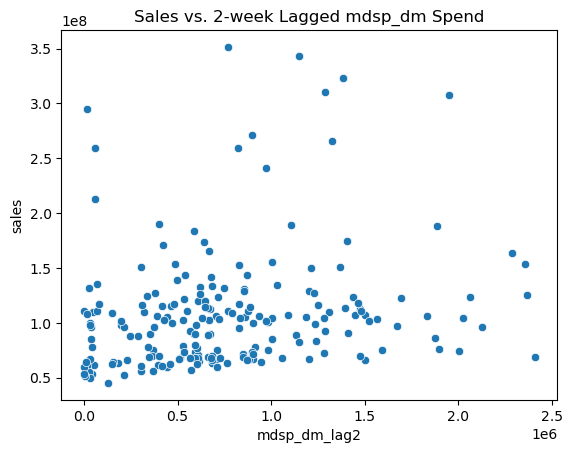

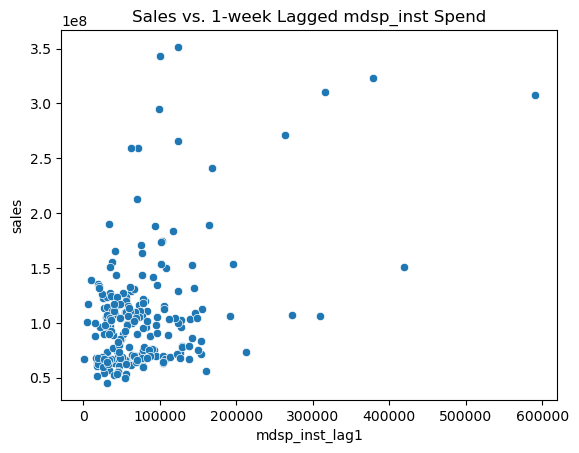

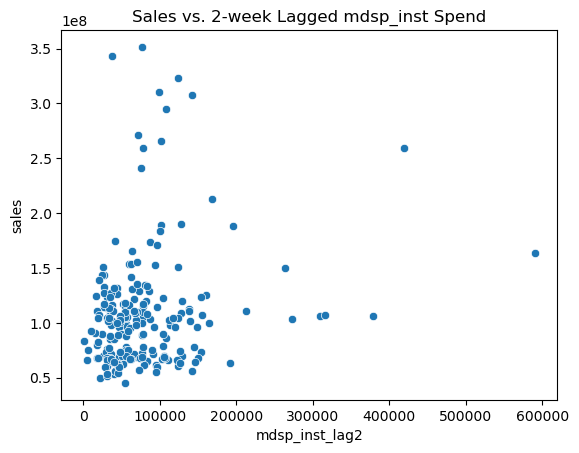

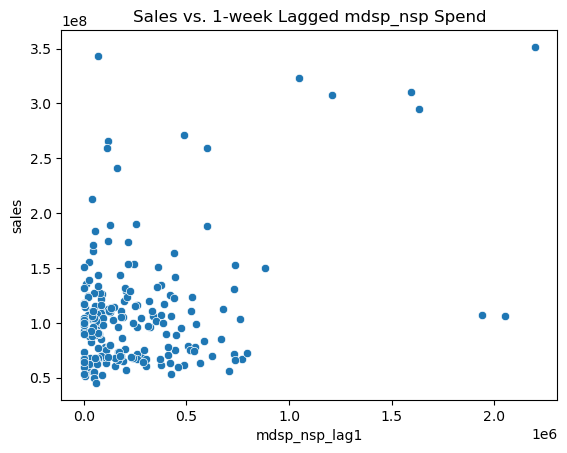

...

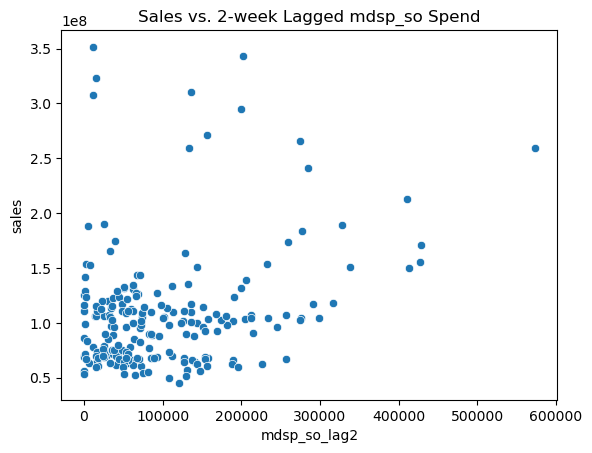

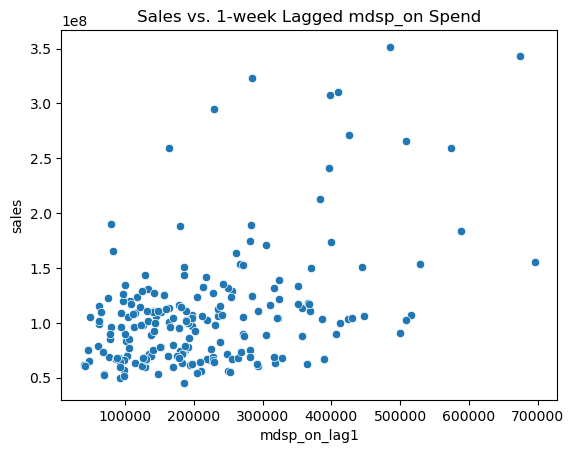

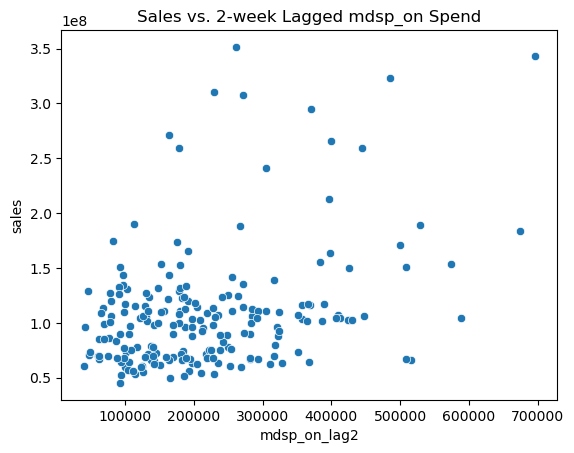

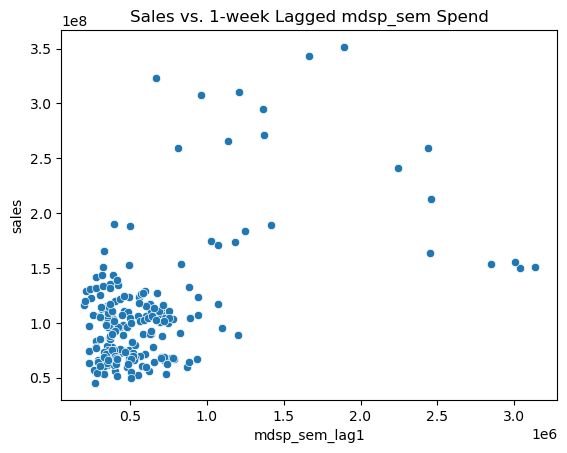

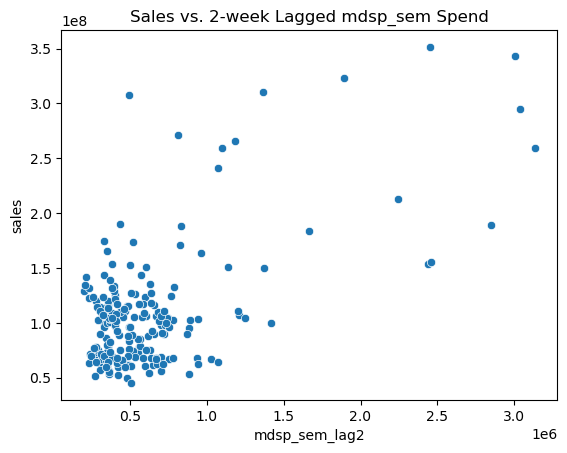

In [33]:
for channel in media_channels_spend:
    # Creating 1-week and 2-week lagged variables
    df[f'{channel}_lag1'] = df[channel].shift(1)
    df[f'{channel}_lag2'] = df[channel].shift(2)
    
    #1-week lag effect
    sns.scatterplot(data=df, x=f'{channel}_lag1', y='sales')
    plt.title(f'Sales vs. 1-week Lagged {channel} Spend')
    plt.show()
    
    # 2-week lag effect
    sns.scatterplot(data=df, x=f'{channel}_lag2', y='sales')
    plt.title(f'Sales vs. 2-week Lagged {channel} Spend')
    plt.show()

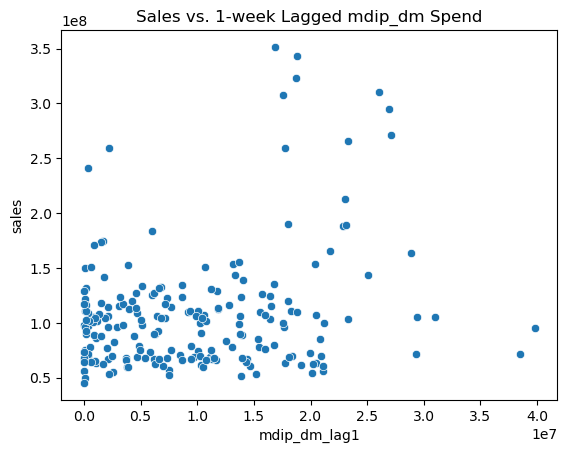

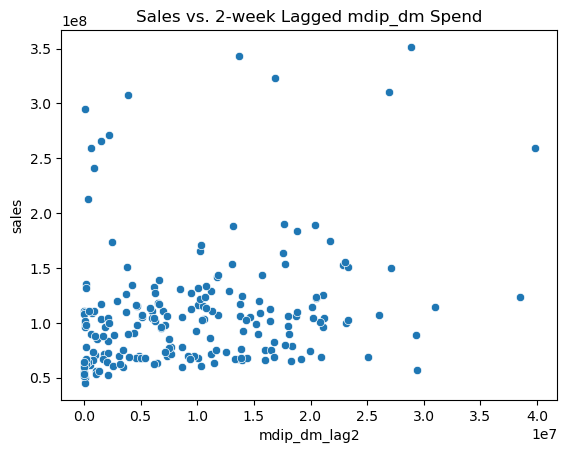

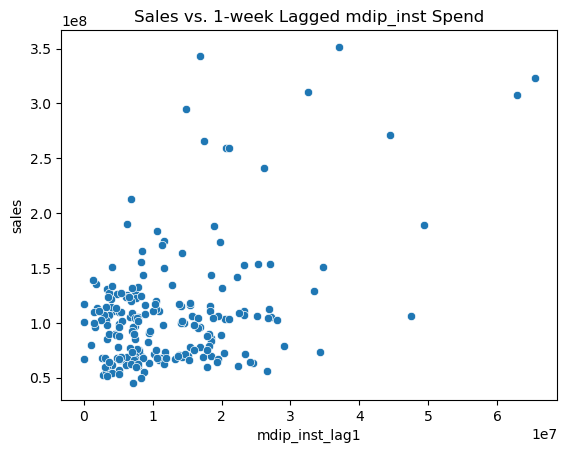

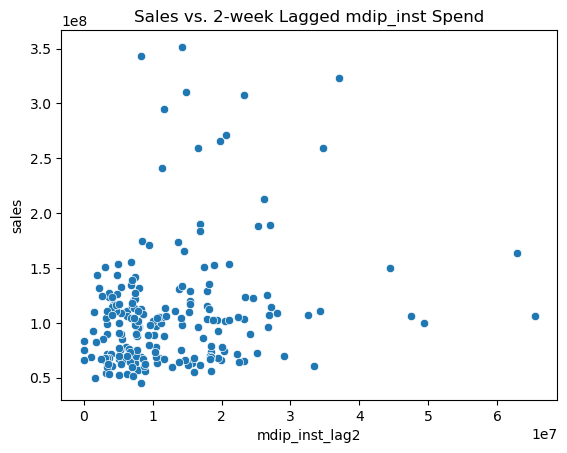

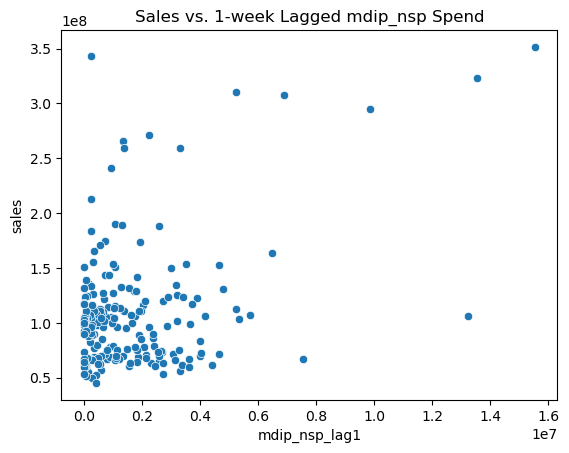

...

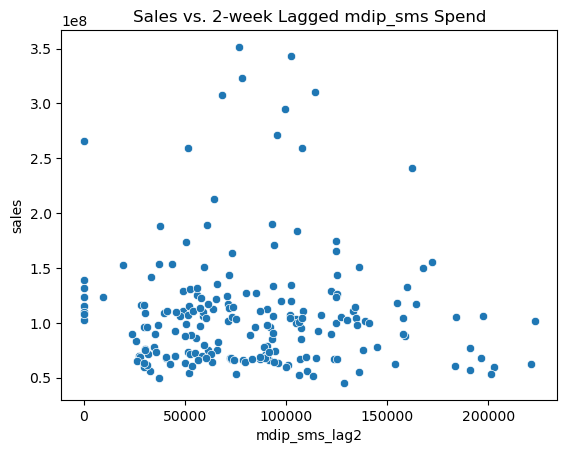

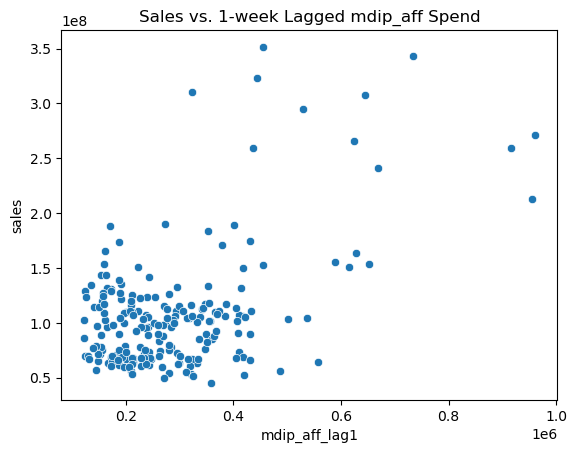

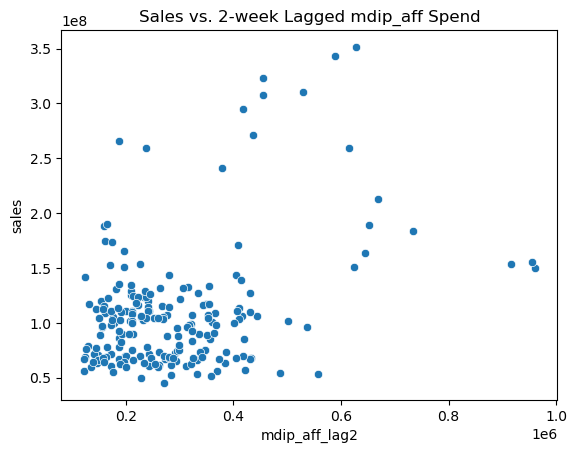

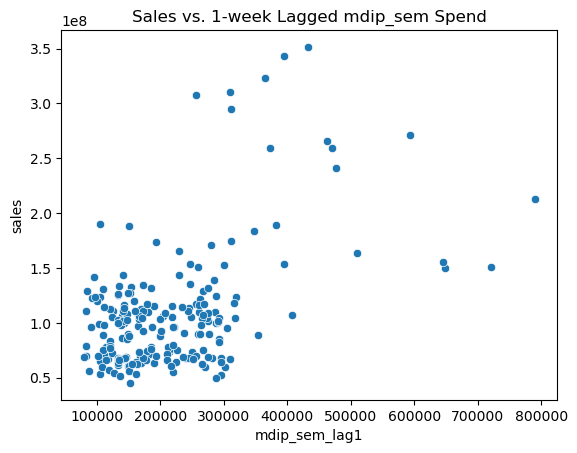

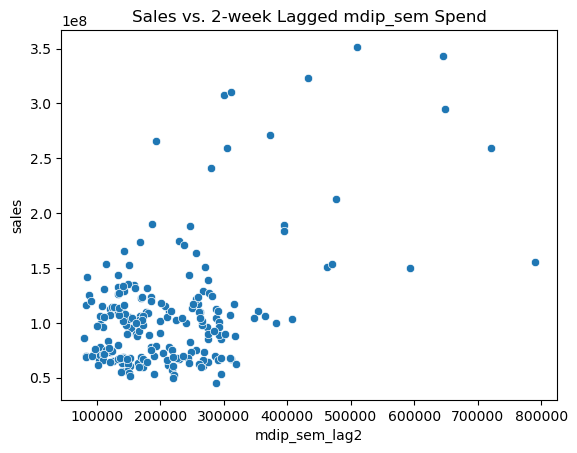

In [34]:
for channel in media_channels_impressions:
    # Creating 1-week and 2-week lagged variables
    df[f'{channel}_lag1'] = df[channel].shift(1)
    df[f'{channel}_lag2'] = df[channel].shift(2)
    
    #1-week lag effect
    sns.scatterplot(data=df, x=f'{channel}_lag1', y='sales')
    plt.title(f'Sales vs. 1-week Lagged {channel} Spend')
    plt.show()
    
    # 2-week lag effect
    sns.scatterplot(data=df, x=f'{channel}_lag2', y='sales')
    plt.title(f'Sales vs. 2-week Lagged {channel} Spend')
    plt.show()

In [35]:
df.columns

Index(['wk_strt_dt', 'yr_nbr', 'qtr_nbr', 'prd', 'wk_nbr', 'wk_in_yr_nbr',
       'mdip_dm', 'mdip_inst', 'mdip_nsp', 'mdip_auddig',
       ...
       'mdip_on_lag1', 'mdip_on_lag2', 'mdip_em_lag1', 'mdip_em_lag2',
       'mdip_sms_lag1', 'mdip_sms_lag2', 'mdip_aff_lag1', 'mdip_aff_lag2',
       'mdip_sem_lag1', 'mdip_sem_lag2'],
      dtype='object', length=127)

In [47]:
def plot_with_trend_line_and_correlation(df, x_variable, y_variable='sales'):
    # Creating a new DataFrame for plotting that drops rows with NaN in the relevant columns
    plot_df = df[[x_variable, y_variable]].dropna()
    
    # Calculating the correlation coefficient for the original variable
    correlation = plot_df[x_variable].corr(plot_df[y_variable])
    
    # Creating 1-week and 2-week lagged variables for the x_variable
    plot_df[f'{x_variable}_lag1'] = plot_df[x_variable].shift(1)
    plot_df[f'{x_variable}_lag2'] = plot_df[x_variable].shift(2)
    
    # Dropping NaN values from the lagged DataFrames
    plot_df_lag1 = plot_df.dropna(subset=[f'{x_variable}_lag1', y_variable])
    plot_df_lag2 = plot_df.dropna(subset=[f'{x_variable}_lag2', y_variable])
    
    # Calculating the correlation coefficient for the lagged variables
    correlation_lag1 = plot_df_lag1[f'{x_variable}_lag1'].corr(plot_df_lag1[y_variable])
    correlation_lag2 = plot_df_lag2[f'{x_variable}_lag2'].corr(plot_df_lag2[y_variable])
    
    #plotting
    plt.figure(figsize=(18, 6))

    # Original variable scatterplot
    plt.subplot(1, 3, 1)
    sns.scatterplot(data=plot_df, x=x_variable, y=y_variable)
    z = np.polyfit(plot_df[x_variable], plot_df[y_variable], 1)
    p = np.poly1d(z)
    plt.plot(plot_df[x_variable], p(plot_df[x_variable]), "r--")
    plt.title(f'Original {y_variable} vs. {x_variable}\n(Correlation: {correlation:.2f})')

    # 1-week lag scatterplot
    plt.subplot(1, 3, 2)
    sns.scatterplot(data=plot_df_lag1, x=f'{x_variable}_lag1', y=y_variable)
    z_lag1 = np.polyfit(plot_df_lag1[f'{x_variable}_lag1'], plot_df_lag1[y_variable], 1)
    p_lag1 = np.poly1d(z_lag1)
    plt.plot(plot_df_lag1[f'{x_variable}_lag1'], p_lag1(plot_df_lag1[f'{x_variable}_lag1']), "r--")
    plt.title(f'1-week Lag {y_variable} vs. {x_variable}\n(Correlation: {correlation_lag1:.2f})')

    # 2-week lag scatterplot
    plt.subplot(1, 3, 3)
    sns.scatterplot(data=plot_df_lag2, x=f'{x_variable}_lag2', y=y_variable)
    z_lag2 = np.polyfit(plot_df_lag2[f'{x_variable}_lag2'], plot_df_lag2[y_variable], 1)
    p_lag2 = np.poly1d(z_lag2)
    plt.plot(plot_df_lag2[f'{x_variable}_lag2'], p_lag2(plot_df_lag2[f'{x_variable}_lag2']), "r--")
    plt.title(f'2-week Lag {y_variable} vs. {x_variable}\n(Correlation: {correlation_lag2:.2f})')

    plt.tight_layout()
    plt.show()

    # Return the correlation values
    return correlation, correlation_lag1, correlation_lag2



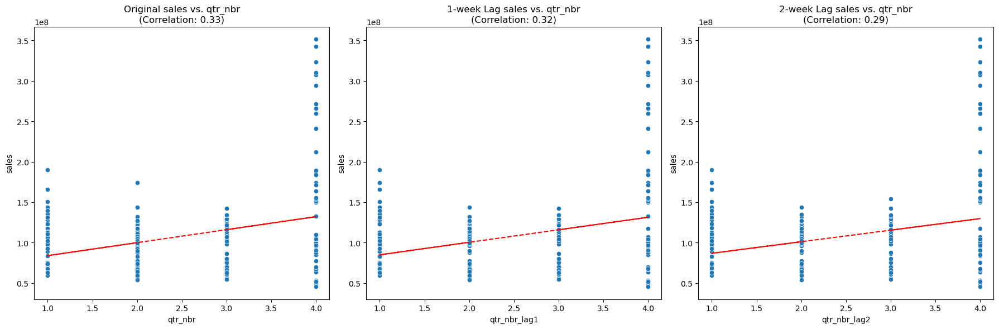

(0.3302430584766649, 0.3181834807384622, 0.29438392411244535)

In [48]:
plot_with_trend_line_and_correlation(df, 'qtr_nbr')

**Quarter Number vs Sales - Corr - 0.33. Positive but not strong correlation. 4 highest.**

**Year vs Sales - Corr = -0.145. Negative but weak strong correlation. 4 highest.**

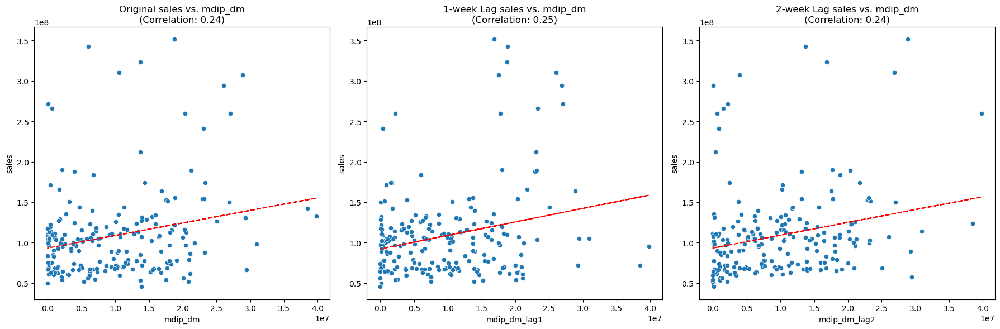

(0.23606355471826787, 0.25274843810837244, 0.24020526905297188)

In [49]:
plot_with_trend_line_and_correlation(df, 'mdip_dm')

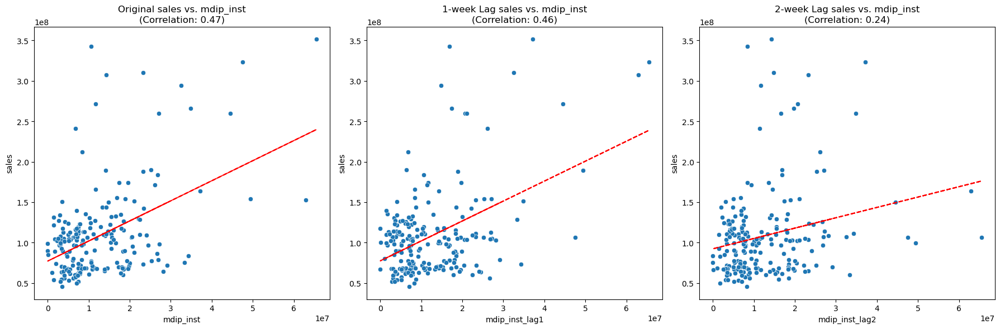

(0.466696047162836, 0.4628463243596688, 0.23983623091919531)

In [50]:
plot_with_trend_line_and_correlation(df, 'mdip_inst')

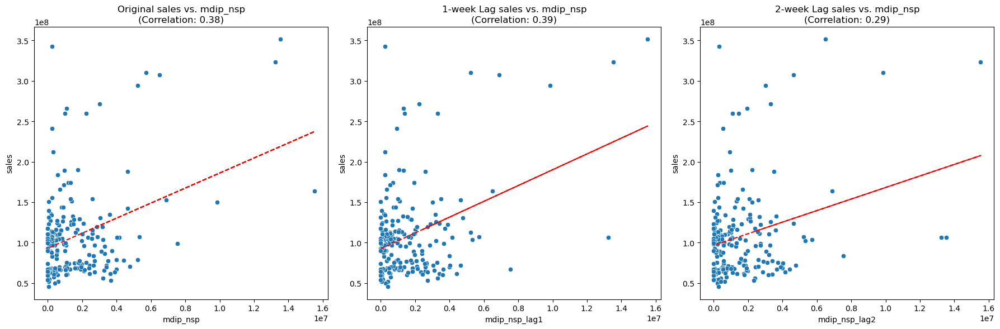

(0.37528735419056997, 0.3943815066267299, 0.28789685052532804)

In [51]:
plot_with_trend_line_and_correlation(df, 'mdip_nsp')

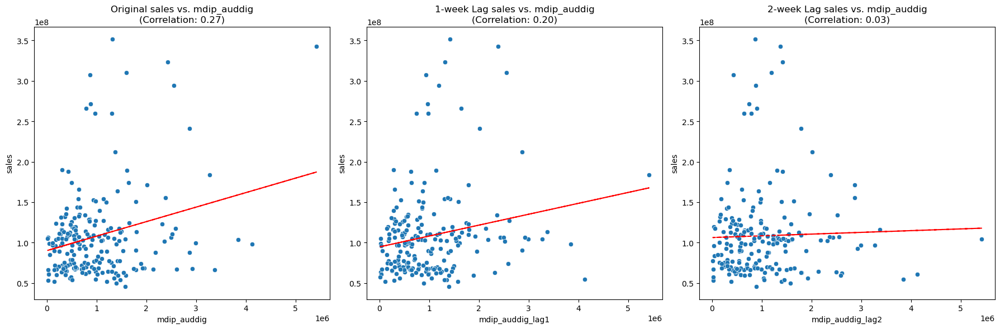

(0.2666296927005228, 0.19990450200821033, 0.031701289793136515)

In [52]:
plot_with_trend_line_and_correlation(df, 'mdip_auddig')

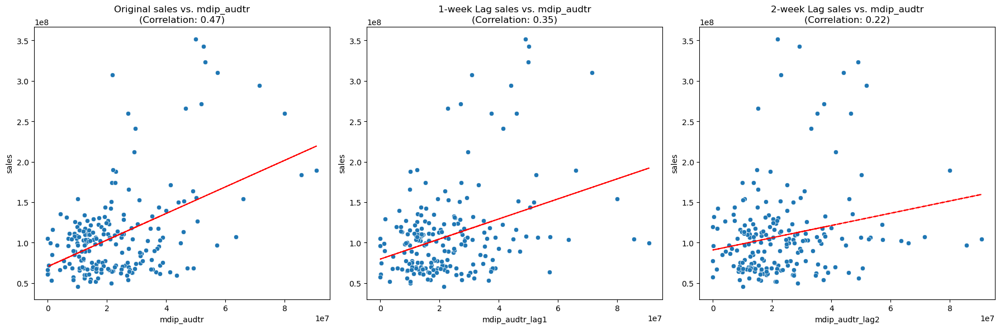

(0.47145554446280086, 0.3546875425403572, 0.21638217436951374)

In [53]:
plot_with_trend_line_and_correlation(df, 'mdip_audtr')

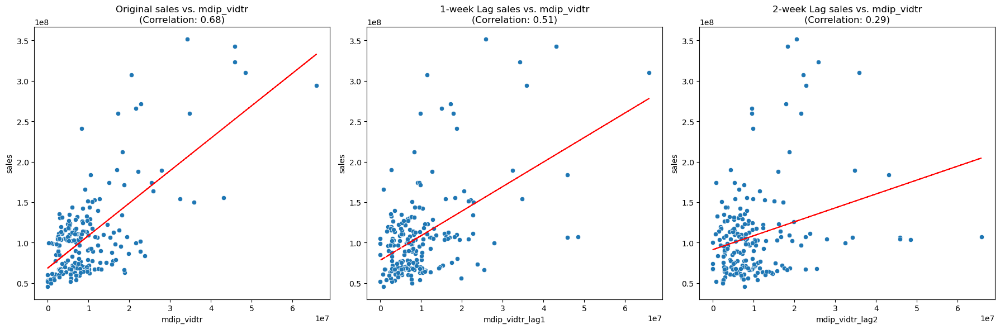

(0.680728491902644, 0.5139645650705272, 0.2913046938644843)

In [54]:
plot_with_trend_line_and_correlation(df, 'mdip_vidtr')

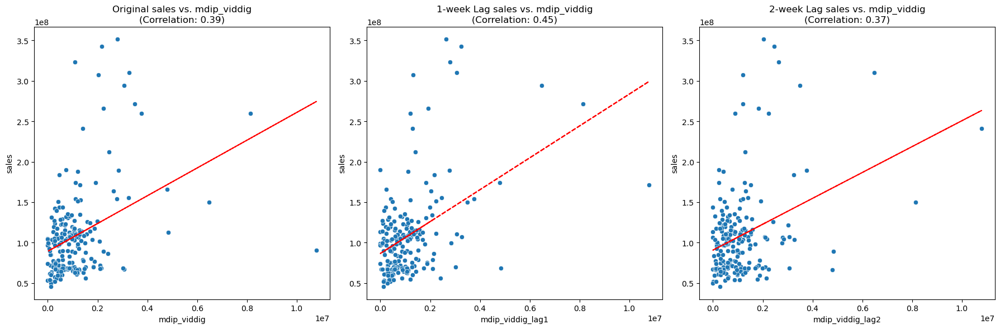

(0.3923410471989002, 0.45011390243780003, 0.3650497086009945)

In [57]:
plot_with_trend_line_and_correlation(df, 'mdip_viddig')

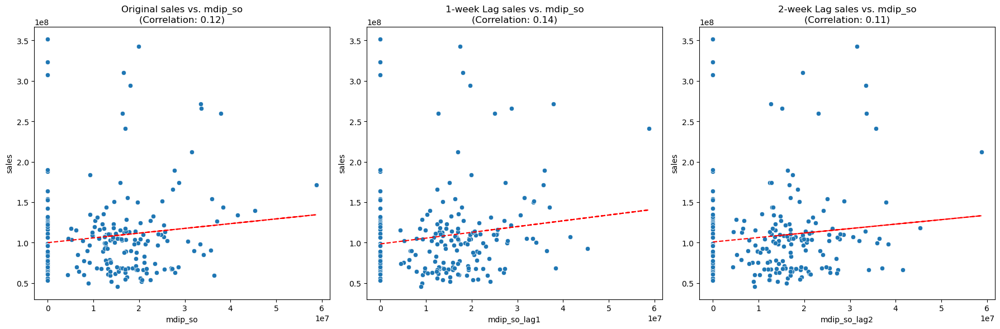

(0.11733818470883976, 0.14302713501992484, 0.11033494534803165)

In [58]:
plot_with_trend_line_and_correlation(df, 'mdip_so')

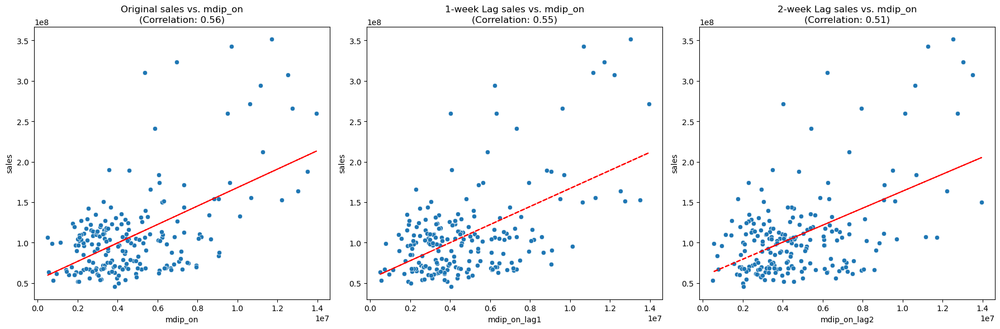

(0.5579004610122649, 0.5465696732726858, 0.5147353290427061)

In [59]:
plot_with_trend_line_and_correlation(df, 'mdip_on')

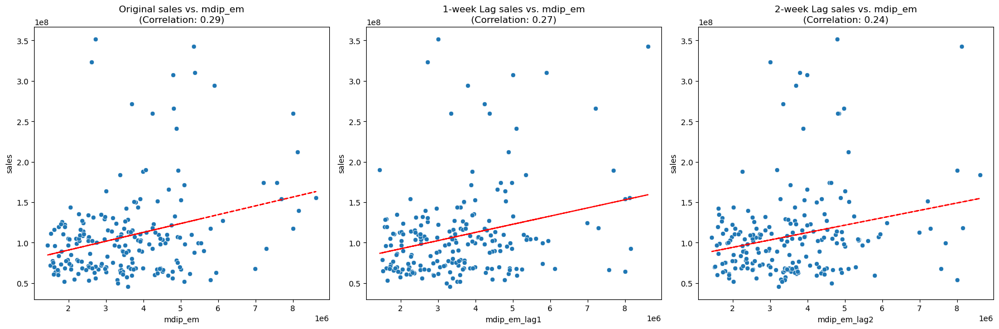

(0.29400933907951615, 0.2708076121886169, 0.2440834232788497)

In [60]:
plot_with_trend_line_and_correlation(df, 'mdip_em')

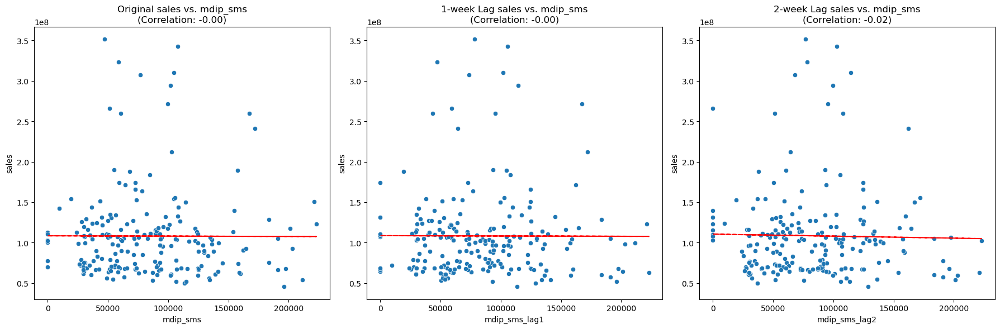

(-0.003497986047171562, -0.0033063354325092403, -0.02120563655176213)

In [61]:
plot_with_trend_line_and_correlation(df, 'mdip_sms')

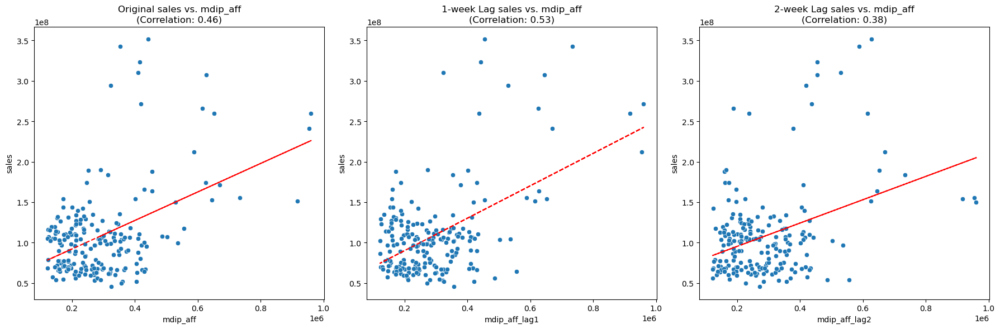

(0.46130180234615387, 0.5251390558740974, 0.37811060604736685)

In [62]:
plot_with_trend_line_and_correlation(df, 'mdip_aff')

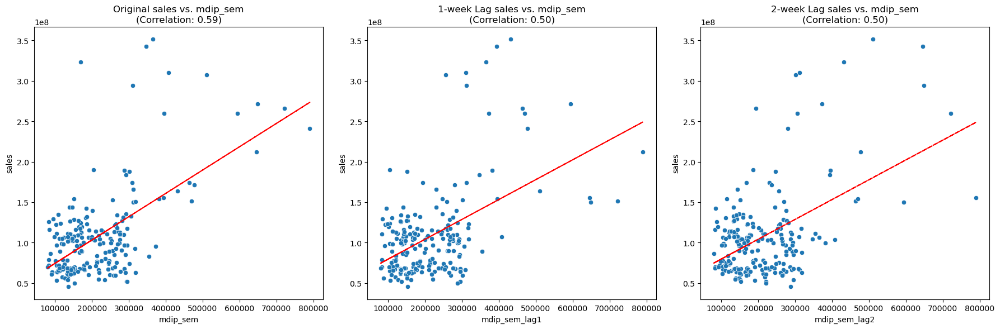

(0.5907233839113564, 0.5036660468982986, 0.5019800065186041)

In [63]:
plot_with_trend_line_and_correlation(df, 'mdip_sem')

MDIP done: Media impressions vs Sales

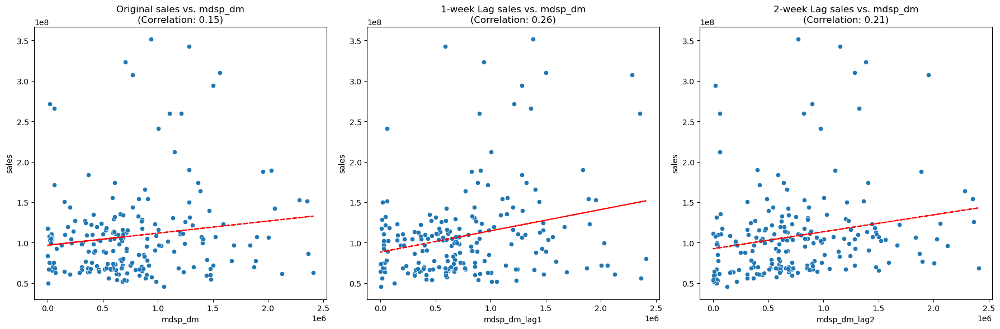

(0.14853884265684994, 0.2608426628468442, 0.20784863814508375)

In [64]:
plot_with_trend_line_and_correlation(df, 'mdsp_dm')

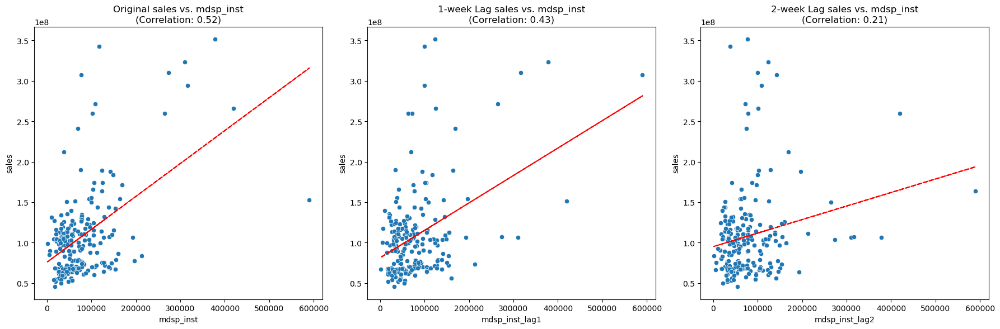

(0.5194721402675021, 0.43311452285299556, 0.21324858081047865)

In [65]:
plot_with_trend_line_and_correlation(df, 'mdsp_inst')

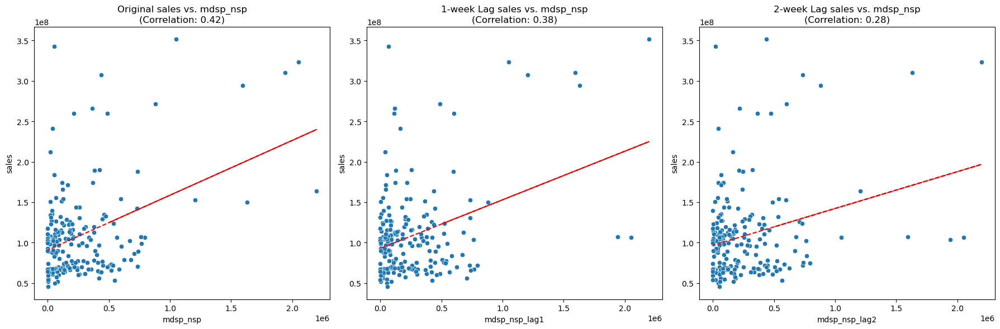

(0.42379678235820933, 0.375366252979085, 0.2843898690783063)

In [66]:
plot_with_trend_line_and_correlation(df, 'mdsp_nsp')

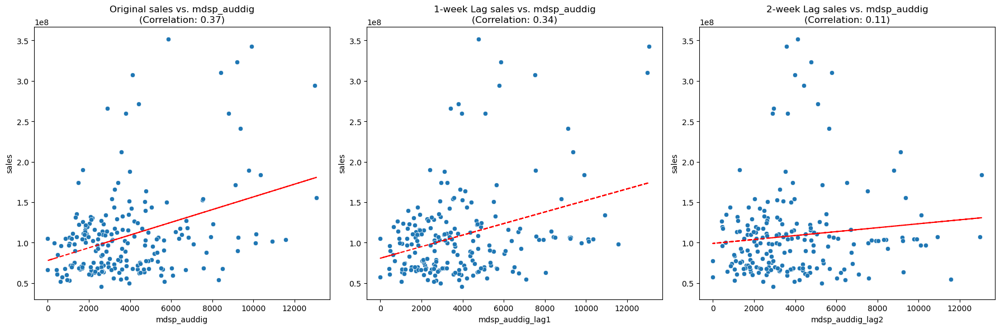

(0.37094599909021747, 0.3357167649816543, 0.1140173837179504)

In [67]:
plot_with_trend_line_and_correlation(df, 'mdsp_auddig')

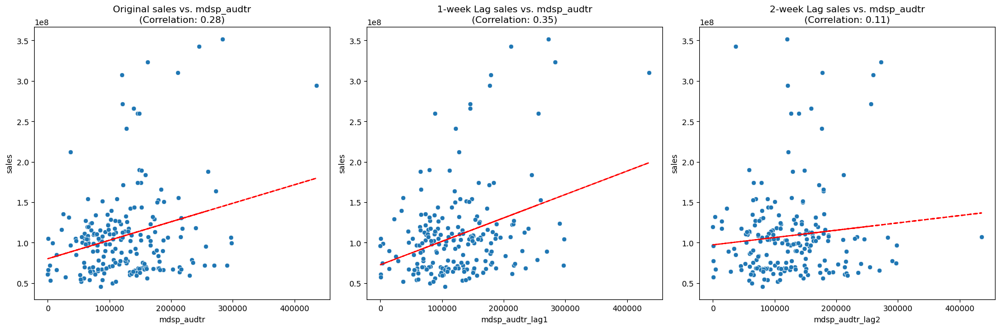

(0.27662956661627586, 0.34832555599202575, 0.10867367239578232)

In [68]:
plot_with_trend_line_and_correlation(df, 'mdsp_audtr')

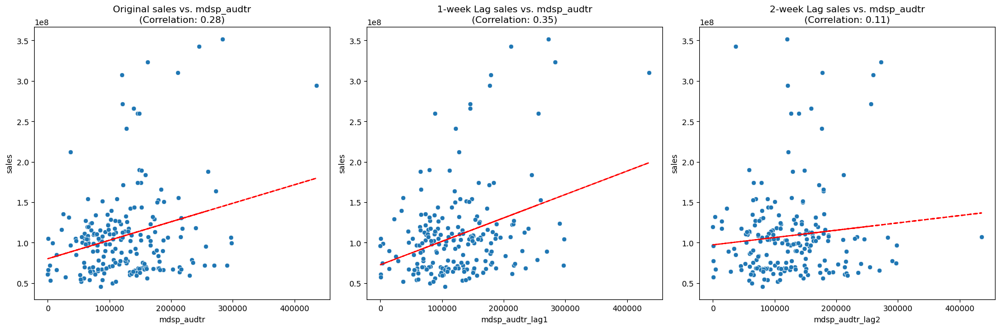

(0.27662956661627586, 0.34832555599202575, 0.10867367239578232)

In [69]:
plot_with_trend_line_and_correlation(df, 'mdsp_audtr')

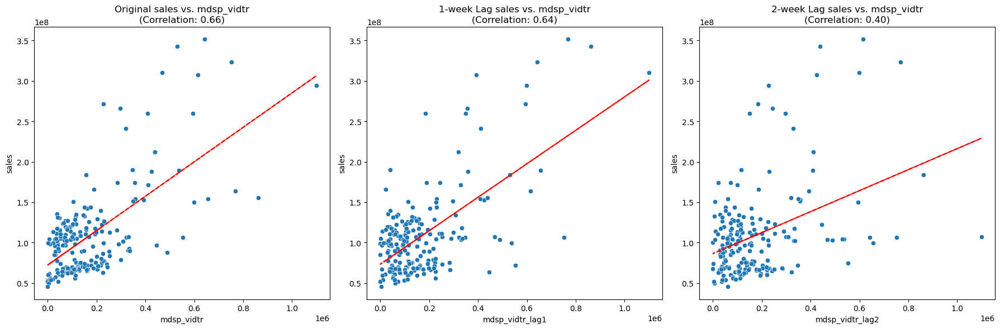

(0.6567368643524839, 0.637976621443616, 0.39960884842001804)

In [70]:
plot_with_trend_line_and_correlation(df, 'mdsp_vidtr')

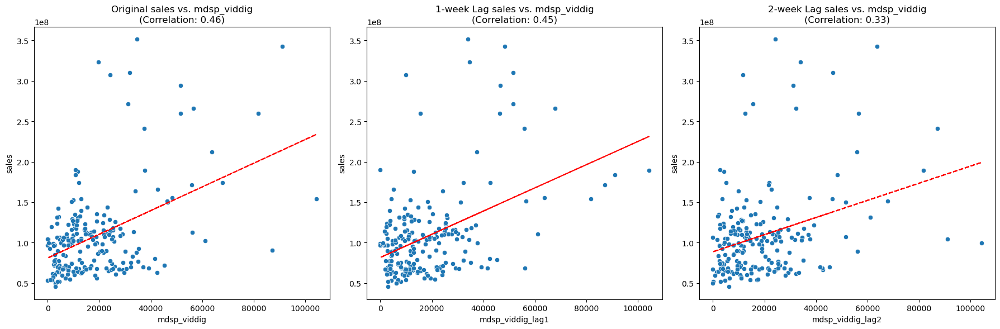

(0.45838923995709885, 0.44802643657631025, 0.3302899635174908)

In [71]:
plot_with_trend_line_and_correlation(df, 'mdsp_viddig')

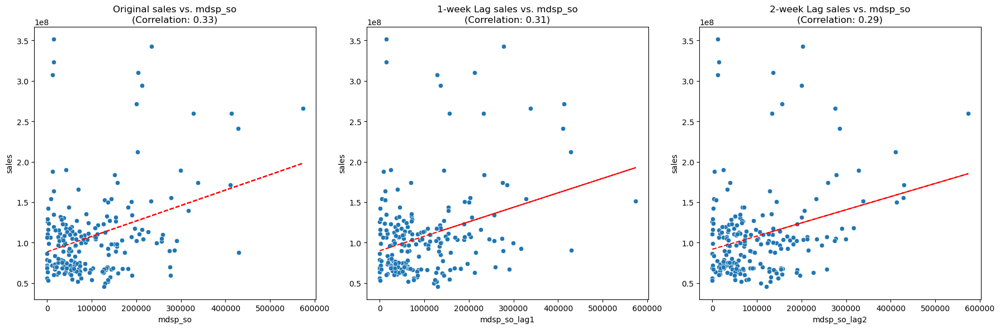

(0.3348588640275477, 0.31418476008639223, 0.28592239980072637)

In [72]:
plot_with_trend_line_and_correlation(df, 'mdsp_so')

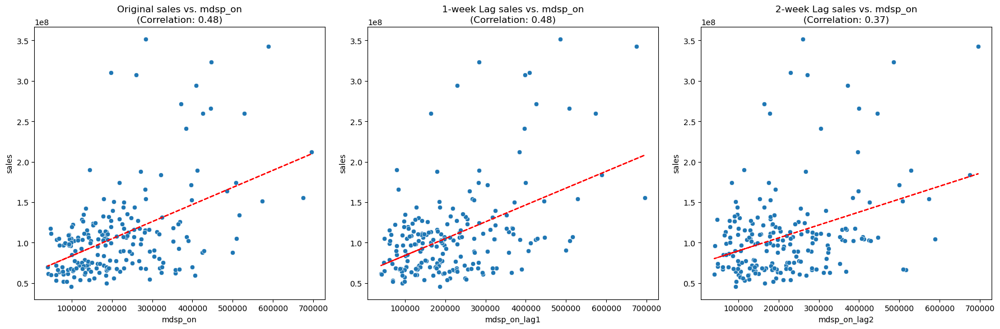

(0.48332734402603117, 0.4759544126427127, 0.3654282886673334)

In [73]:
plot_with_trend_line_and_correlation(df, 'mdsp_on')

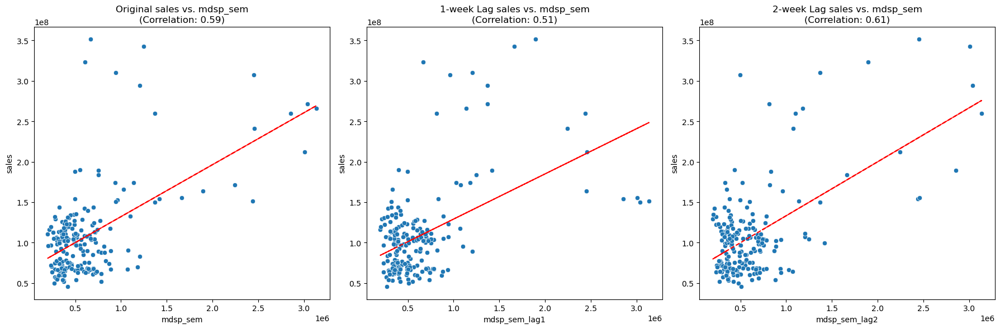

(0.5864087209773982, 0.5101990182687081, 0.6094464923839544)

In [74]:
plot_with_trend_line_and_correlation(df, 'mdsp_sem')

In [75]:
def plot_line_charts_with_lags(df, x_variable, y_variable='sales'):
    """
    Creates a 1x3 matrix of line charts with the specified x variable and sales over time,
    including charts with 1-week and 2-week lags for the x variable.

    Args:
    - df (DataFrame): The dataset containing the variables.
    - x_variable (str): The name of the x variable to plot against time.
    - y_variable (str): The name of the y variable, default is 'sales'.
    """

    # Ensuring the date column is in datetime format
    df['wk_strt_dt'] = pd.to_datetime(df['wk_strt_dt'])

    # Creating lagged variables
    df[f'{x_variable}_lag1'] = df[x_variable].shift(1)
    df[f'{x_variable}_lag2'] = df[x_variable].shift(2)

    # Setting up the figure for plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    
    # Original variable line chart
    axes[0].plot(df['wk_strt_dt'], df[y_variable], label=y_variable, color='blue')
    axes[0].plot(df['wk_strt_dt'], df[x_variable], label=x_variable, color='red')
    axes[0].set_title(f'Original {y_variable} and {x_variable}')
    axes[0].legend(loc='upper left')
    
    # 1-week lag line chart
    axes[1].plot(df['wk_strt_dt'], df[y_variable], label=y_variable, color='blue')
    axes[1].plot(df['wk_strt_dt'], df[f'{x_variable}_lag1'], label=f'{x_variable} (1-week lag)', color='red')
    axes[1].set_title(f'{y_variable} and 1-week Lag of {x_variable}')
    axes[1].legend(loc='upper left')

    # 2-week lag line chart
    axes[2].plot(df['wk_strt_dt'], df[y_variable], label=y_variable, color='blue')
    axes[2].plot(df['wk_strt_dt'], df[f'{x_variable}_lag2'], label=f'{x_variable} (2-week lag)', color='red')
    axes[2].set_title(f'{y_variable} and 2-week Lag of {x_variable}')
    axes[2].legend(loc='upper left')

    # Plot Contd 
    for ax in axes:
        ax.set_xlabel('Date')
        ax.set_ylabel('Value')
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()



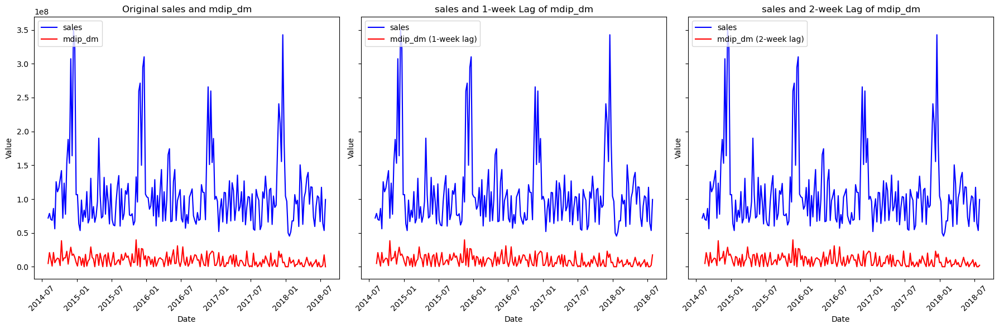

In [76]:
plot_line_charts_with_lags(df, 'mdip_dm')

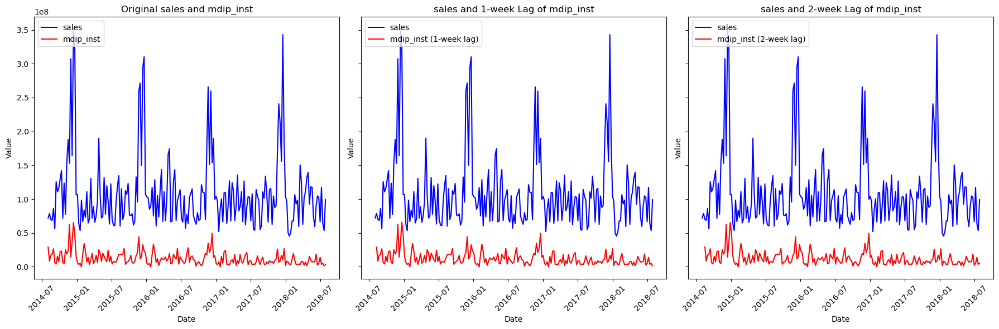

In [77]:
plot_line_charts_with_lags(df, 'mdip_inst')

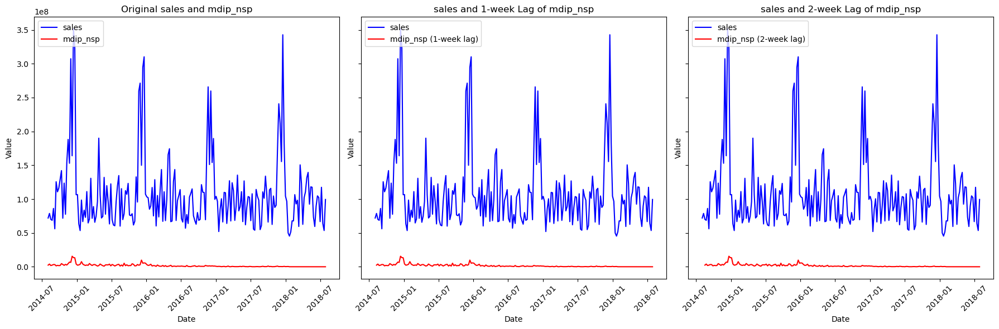

In [78]:
plot_line_charts_with_lags(df, 'mdip_nsp')

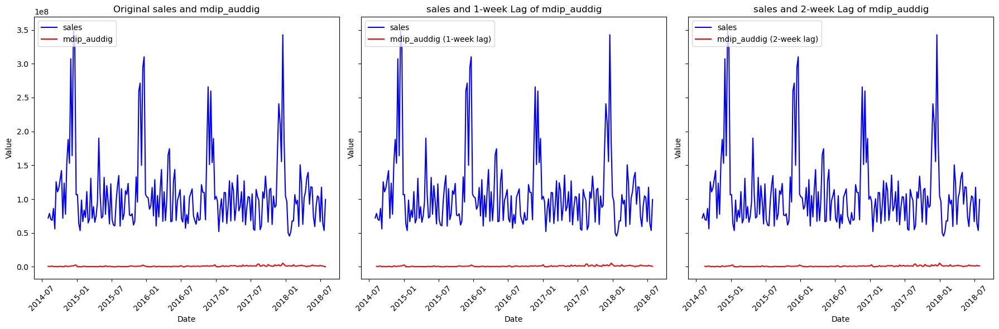

In [79]:
plot_line_charts_with_lags(df, 'mdip_auddig')

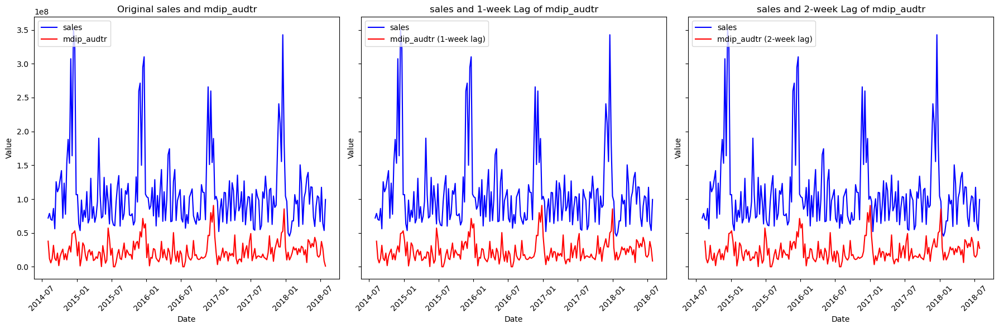

In [81]:
plot_line_charts_with_lags(df, 'mdip_audtr')

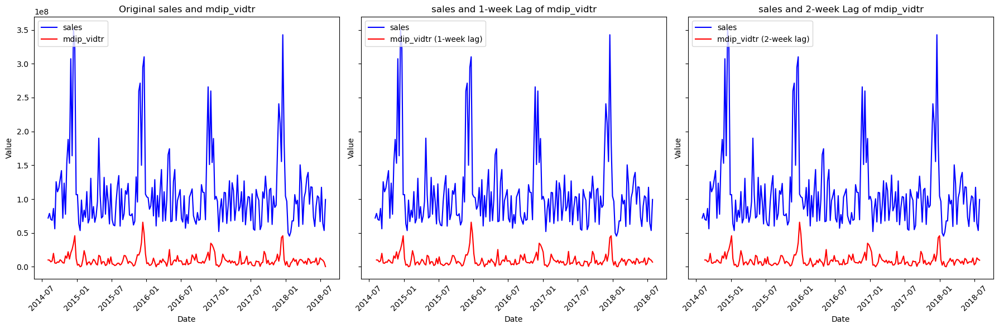

In [82]:
plot_line_charts_with_lags(df, 'mdip_vidtr')

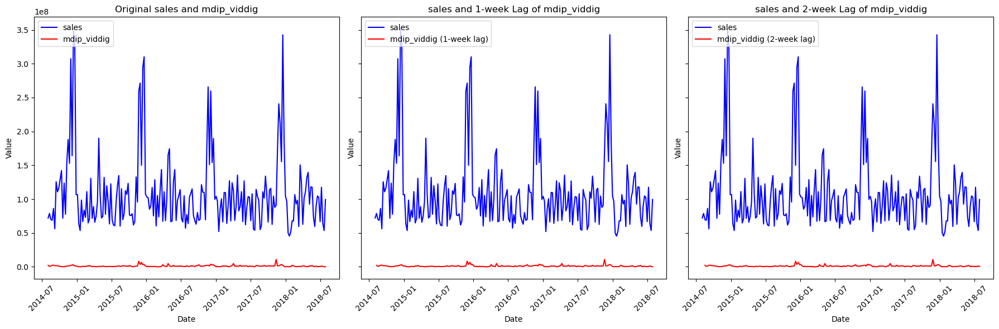

In [83]:
plot_line_charts_with_lags(df, 'mdip_viddig')

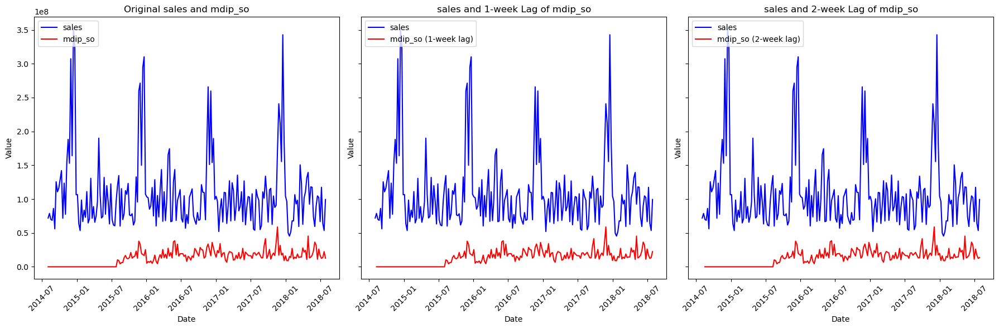

In [84]:
plot_line_charts_with_lags(df, 'mdip_so')

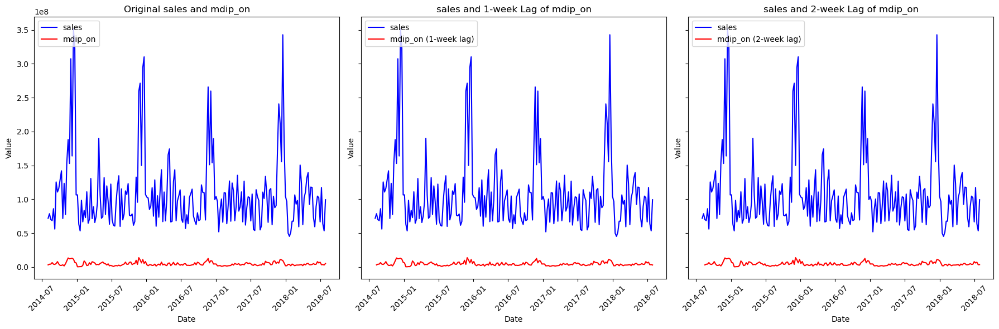

In [85]:
plot_line_charts_with_lags(df, 'mdip_on')

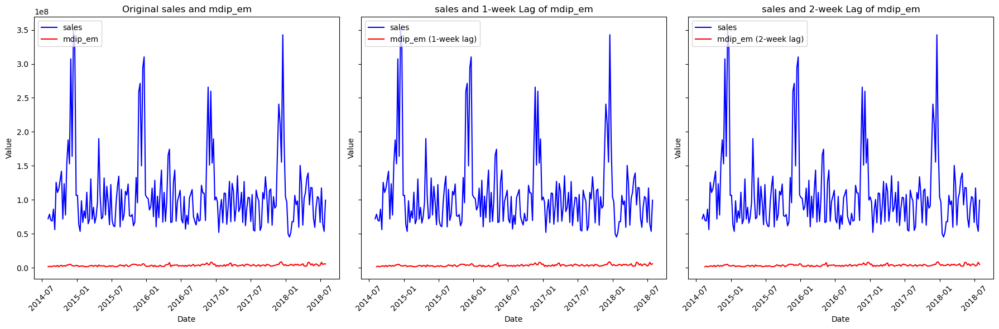

In [86]:
plot_line_charts_with_lags(df, 'mdip_em')

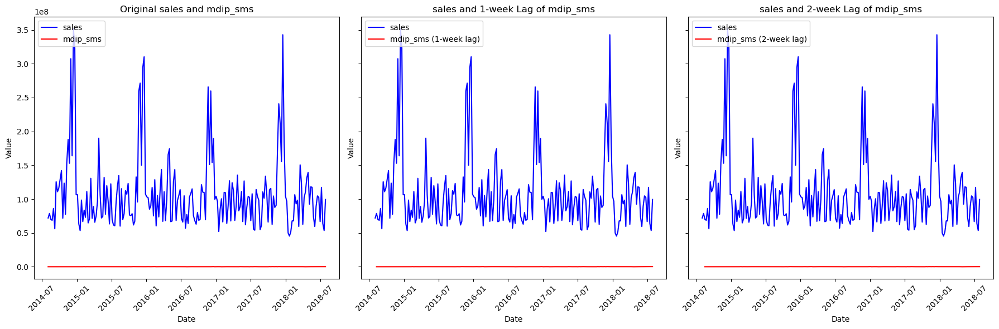

In [87]:
plot_line_charts_with_lags(df, 'mdip_sms')

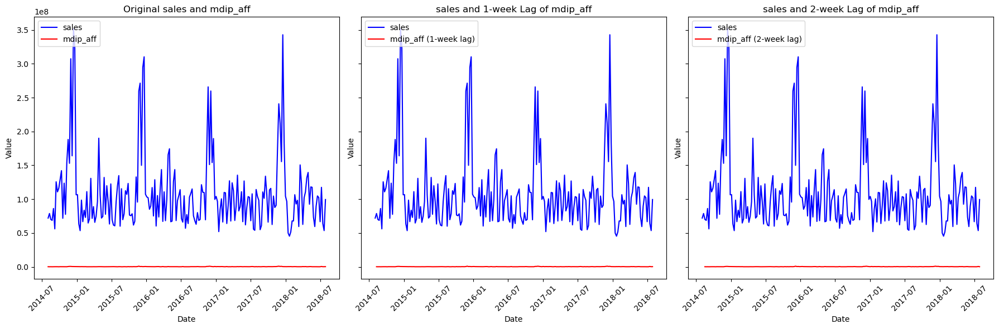

In [88]:
plot_line_charts_with_lags(df, 'mdip_aff')

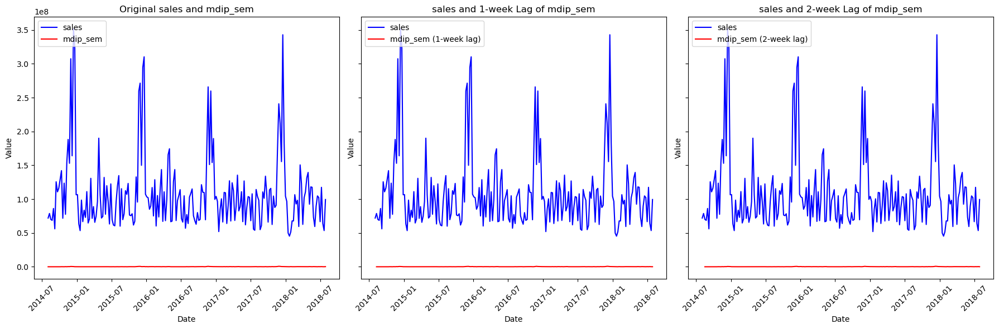

In [89]:
plot_line_charts_with_lags(df, 'mdip_sem')

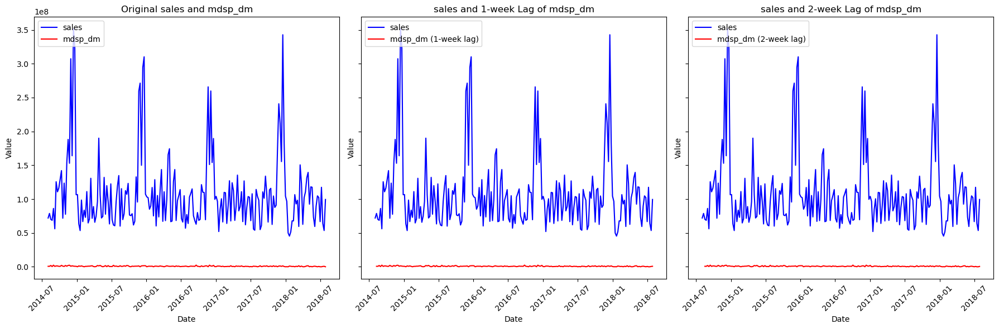

In [90]:
plot_line_charts_with_lags(df, 'mdsp_dm')

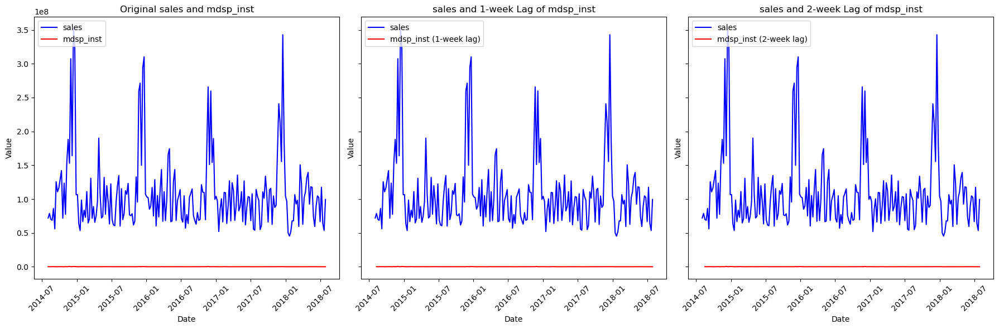

In [91]:
plot_line_charts_with_lags(df, 'mdsp_inst')

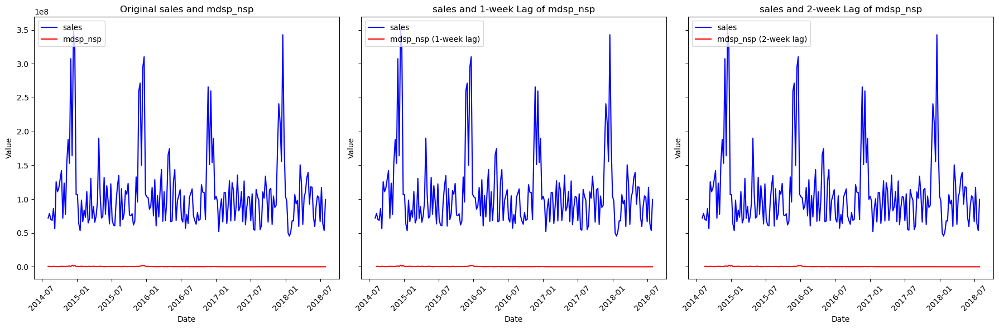

In [92]:
plot_line_charts_with_lags(df, 'mdsp_nsp')

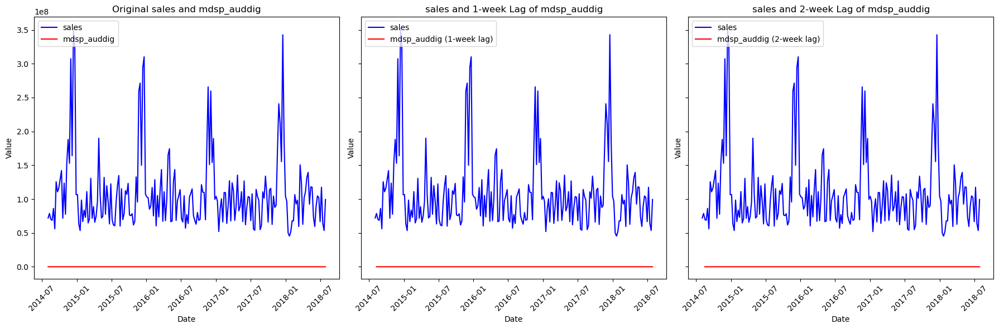

In [93]:
plot_line_charts_with_lags(df, 'mdsp_auddig')

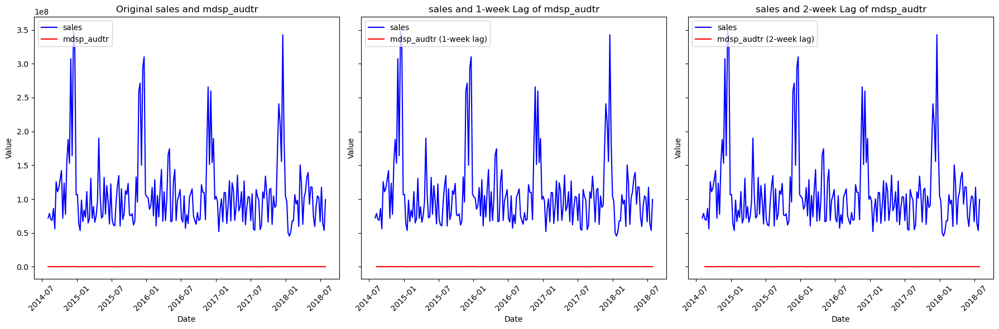

In [94]:
plot_line_charts_with_lags(df, 'mdsp_audtr')

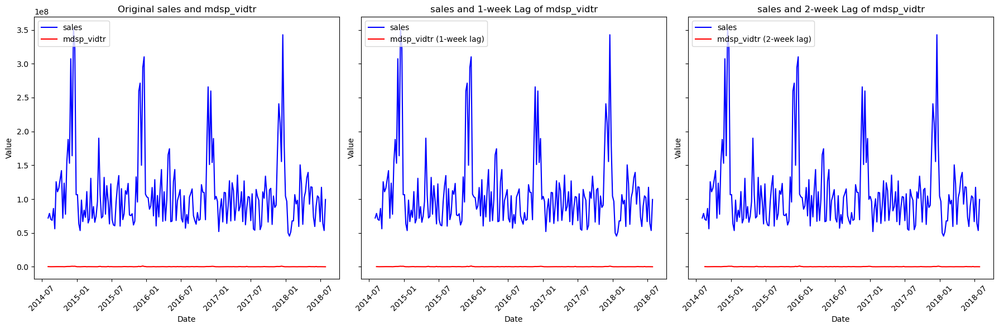

In [95]:
plot_line_charts_with_lags(df, 'mdsp_vidtr')

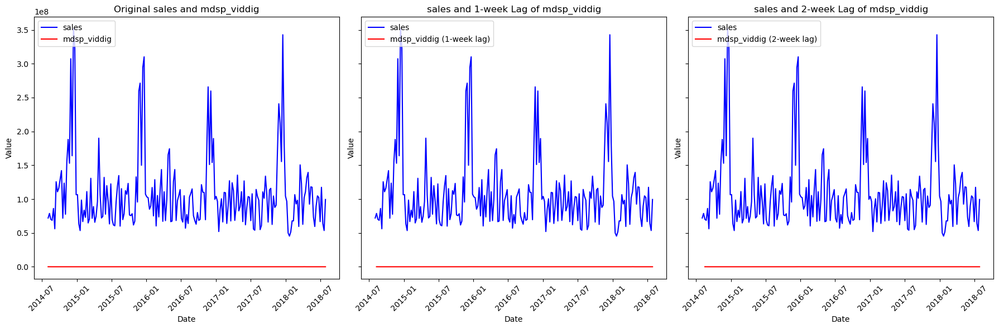

In [96]:
plot_line_charts_with_lags(df, 'mdsp_viddig')

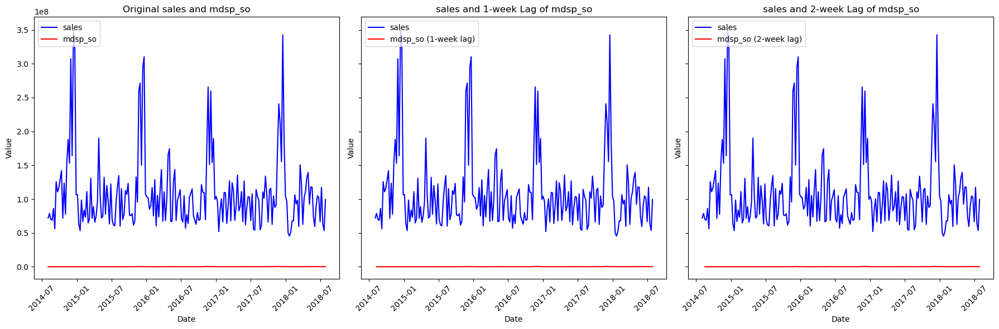

In [97]:
plot_line_charts_with_lags(df, 'mdsp_so')

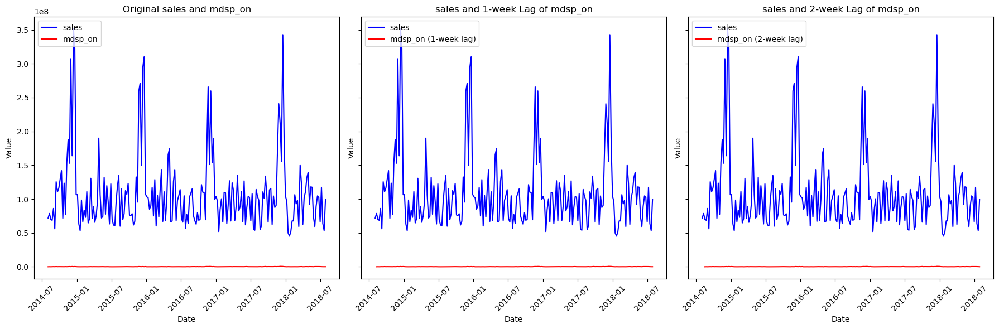

In [98]:
plot_line_charts_with_lags(df, 'mdsp_on')

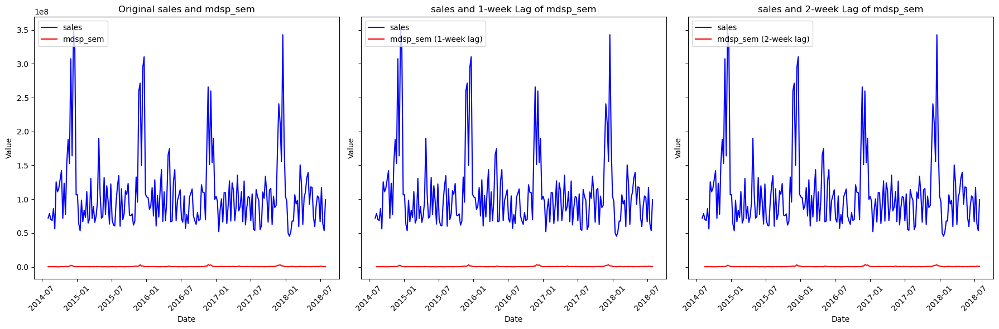

In [99]:
plot_line_charts_with_lags(df, 'mdsp_sem')

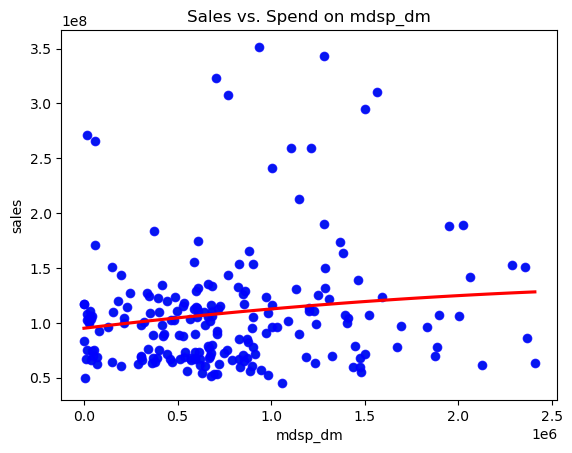

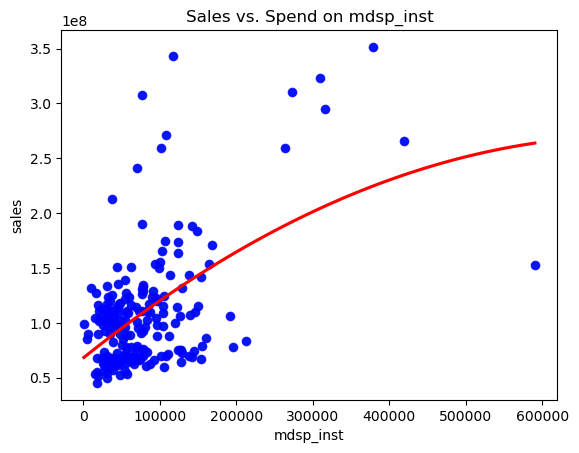

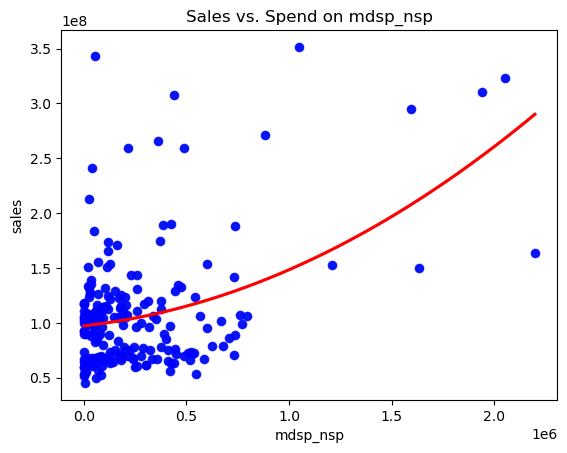

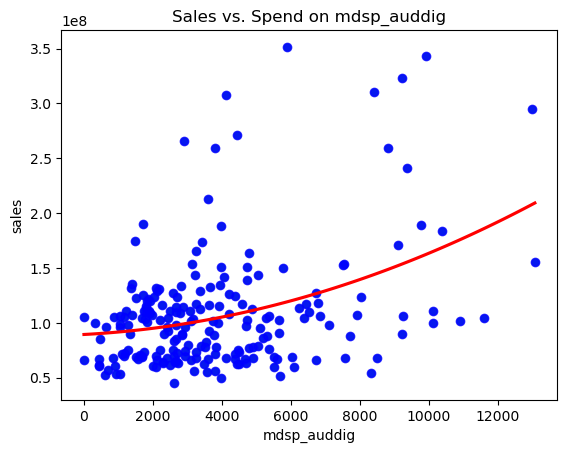

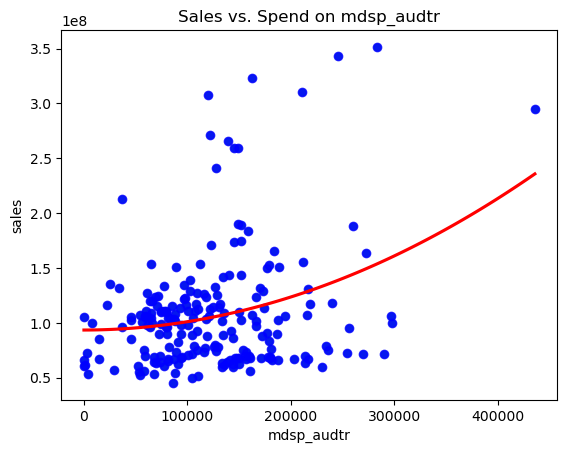

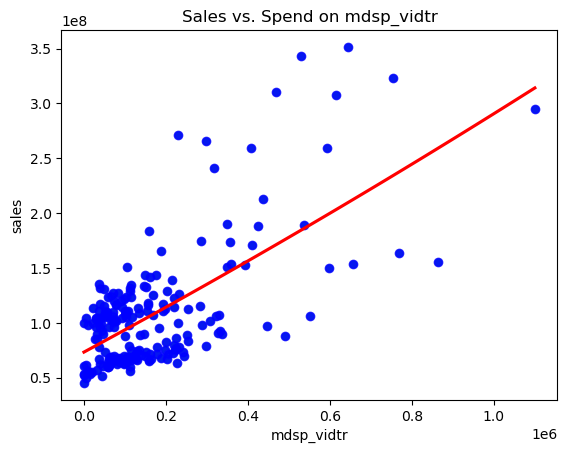

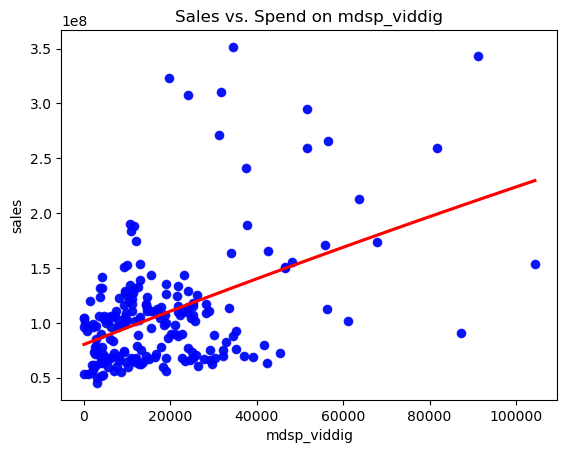

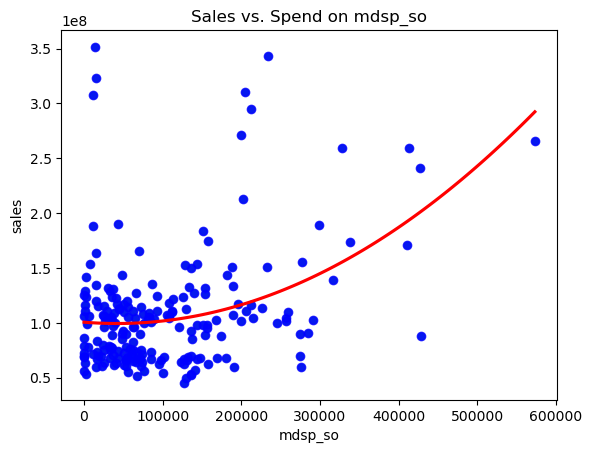

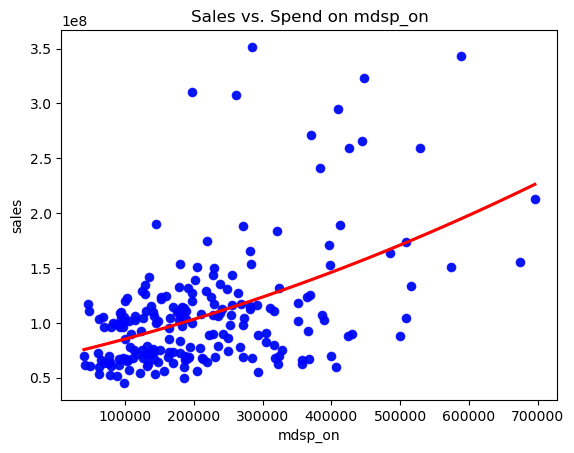

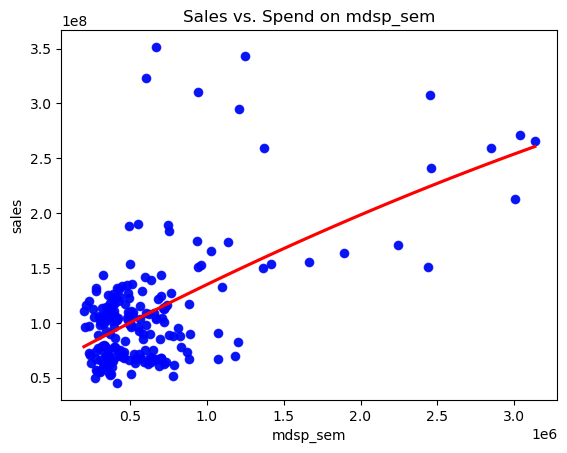

In [100]:
for channel in media_channels_spend:
    sns.scatterplot(x=df[channel], y=df['sales'])
    sns.regplot(x=df[channel], y=df['sales'], order=2, ci=None, scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
    plt.title(f'Sales vs. Spend on {channel}')
    plt.show()


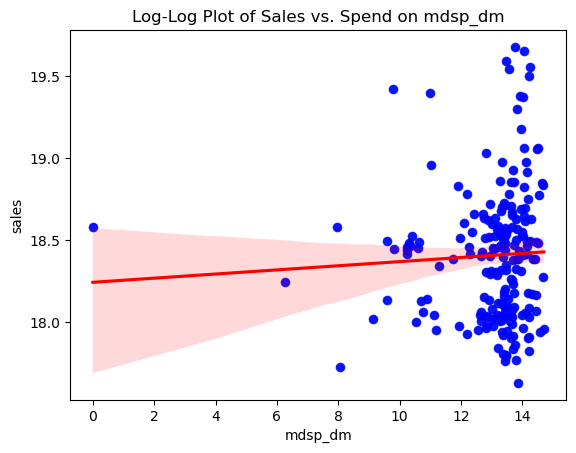

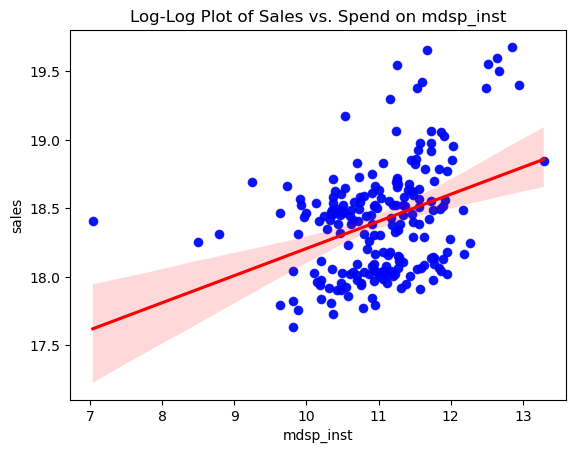

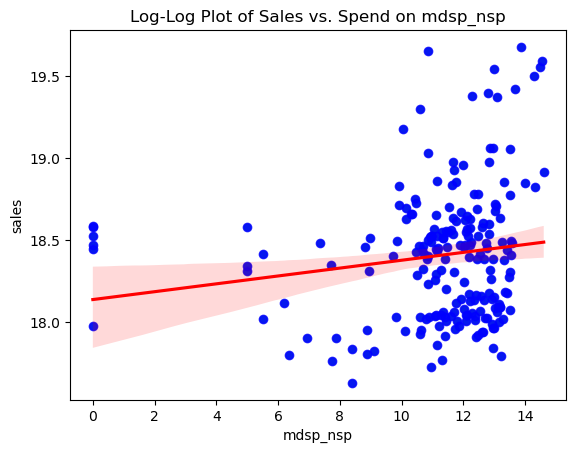

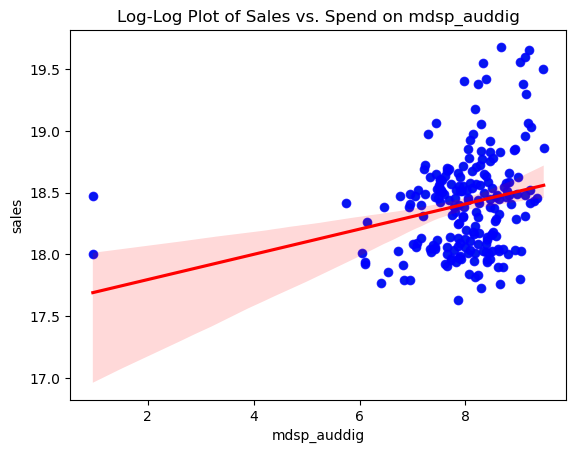

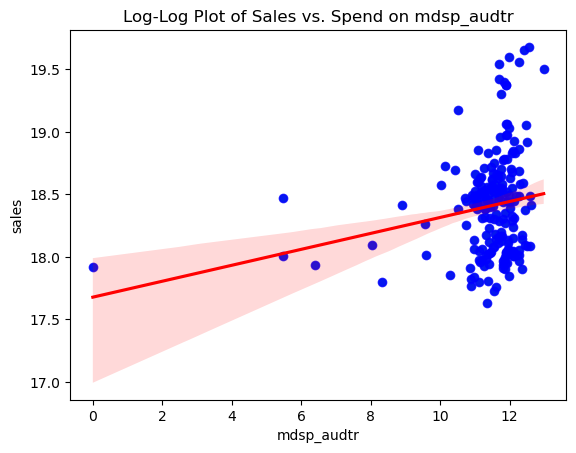

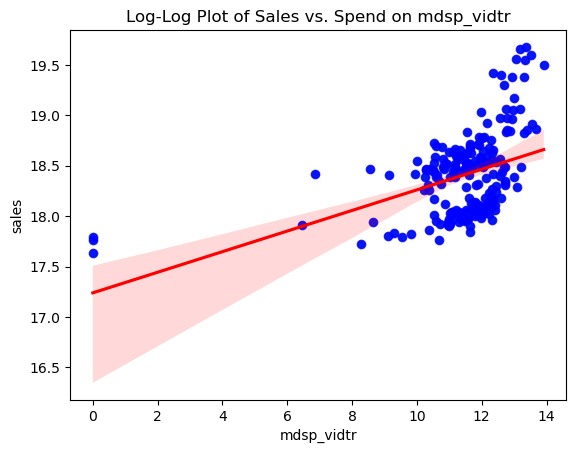

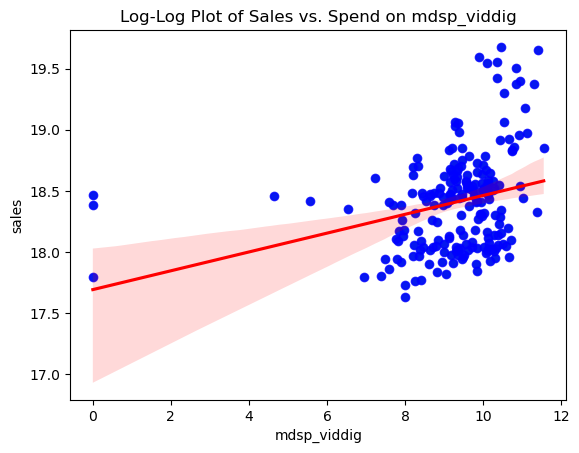

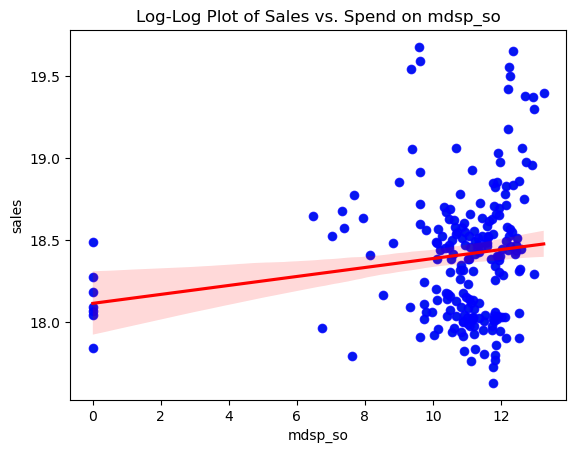

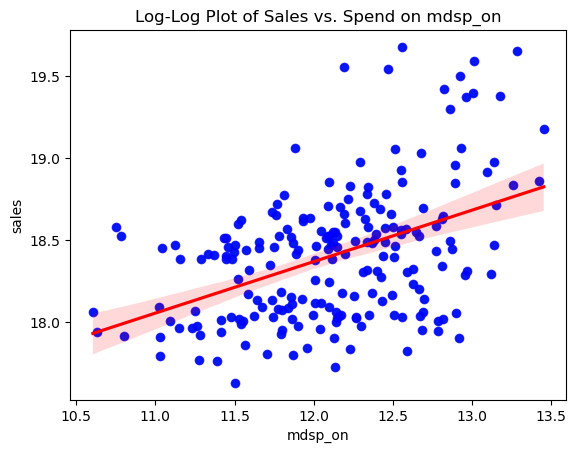

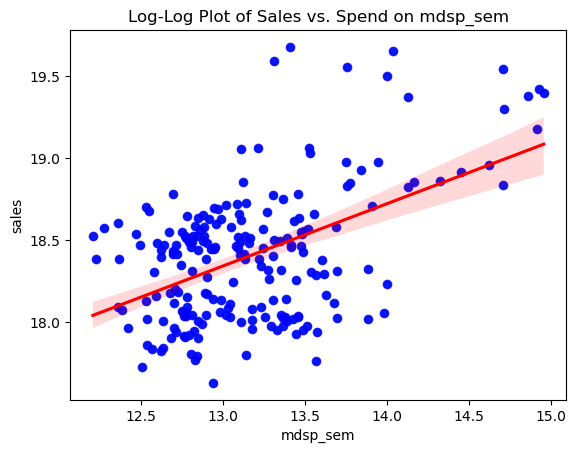

In [101]:
for channel in media_channels_spend:
    df_log_transformed = df.copy()
    df_log_transformed[channel] = np.log1p(df_log_transformed[channel])
    df_log_transformed['sales'] = np.log1p(df_log_transformed['sales'])
    
    sns.scatterplot(x=df_log_transformed[channel], y=df_log_transformed['sales'])
    sns.regplot(x=df_log_transformed[channel], y=df_log_transformed['sales'], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
    plt.title(f'Log-Log Plot of Sales vs. Spend on {channel}')
    plt.show()


MODELING - 1

In [103]:
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size=0.2, shuffle=False)

In [104]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming 'df' is your preprocessed DataFrame with all features and 'sales' is the target variable
X = df.drop('sales', axis=1)  # Features
y = df['sales']  # Target

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

def preprocessing_pipeline(X, y, numerical_columns, lag_columns, lags=[1, 2]):
    """
    Scales numerical columns and creates lagged features.

    Args:
    - X (DataFrame): The feature set of the dataset to preprocess.
    - y (Series): The target variable series.
    - numerical_columns (list): List of column names to be scaled.
    - lag_columns (list): List of column names to create lagged features for.
    - lags (list): List of integers indicating the lag periods.

    Returns:
    - X_processed (DataFrame): The preprocessed feature set.
    - y (Series): The target variable (unaltered).
    - scaler (StandardScaler): The scaler object for inverse transformation if necessary.
    """
    # Copy the input data to avoid changing it outside the function
    X_processed = X.copy()

    # Scale numerical columns
    scaler = StandardScaler()
    X_processed[numerical_columns] = scaler.fit_transform(X_processed[numerical_columns])

    # Create lagged features
    for col in lag_columns:
        for lag in lags:
            X_processed[f'{col}_lag{lag}'] = X_processed[col].shift(lag)

    # Drop the initial rows that contain NaN values after lagging
    X_processed = X_processed.dropna().reset_index(drop=True)
    y = y.iloc[X_processed.index]  # Ensure the target variable aligns with the features after dropping NaNs
    
    return X_processed, y, scaler

# Define the columns to be scaled and lagged
numerical_cols = ['mdip_dm','mdip_inst','mdip_nsp','mdip_auddig','mdip_audtr',
                  'mdip_vidtr','mdip_viddig','mdip_so','mdip_on','mdip_em','mdip_sms',
                  'mdip_aff','mdip_sem','mdsp_dm','mdsp_inst','mdsp_nsp','mdsp_auddig',
                  'mdsp_audtr','mdsp_vidtr','mdsp_viddig','mdsp_so','mdsp_on','mdsp_sem'] 
lag_cols = ['mdip_dm','mdip_inst','mdip_nsp','mdip_auddig','mdip_audtr',
                  'mdip_vidtr','mdip_viddig','mdip_so','mdip_on','mdip_em','mdip_sms',
                  'mdip_aff','mdip_sem','mdsp_dm','mdsp_inst','mdsp_nsp','mdsp_auddig',
                  'mdsp_audtr','mdsp_vidtr','mdsp_viddig','mdsp_so','mdsp_on','mdsp_sem'] 

# Apply the preprocessing pipeline to the train set
X_train_processed, y_train_processed, scaler = preprocessing_pipeline(X_train, y_train, numerical_cols, lag_cols)

# Apply the same transformations to the test set
X_test_processed = X_test.copy()
X_test_processed[numerical_cols] = scaler.transform(X_test_processed[numerical_cols])
for col in lag_cols:
    for lag in [1, 2]:
        X_test_processed[f'{col}_lag{lag}'] = X_test_processed[col].shift(lag)
X_test_processed = X_test_processed.dropna().reset_index(drop=True)
y_test_processed = y_test.iloc[X_test_processed.index]

# You now have `X_train_processed`, `y_train_processed`, `X_test_processed`, and `y_test_processed` ready for modeling.


In [107]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the Linear Regression model
mlr_model = LinearRegression()

# Exclude the 'wk_strt_dt' column from the feature set if it's included
X_train_processed = X_train_processed.drop(columns=['wk_strt_dt'], errors='ignore')
X_test_processed = X_test_processed.drop(columns=['wk_strt_dt'], errors='ignore')

# Now, re-fit the Linear Regression model
mlr_model = LinearRegression()
mlr_model.fit(X_train_processed, y_train_processed)

# Predict and evaluate the model as before
y_train_pred = mlr_model.predict(X_train_processed)
train_mse = mean_squared_error(y_train_processed, y_train_pred)
train_r2 = r2_score(y_train_processed, y_train_pred)

print(f'Training MSE: {train_mse}')
print(f'Training R^2: {train_r2}')

y_test_pred = mlr_model.predict(X_test_processed)
test_mse = mean_squared_error(y_test_processed, y_test_pred)
test_r2 = r2_score(y_test_processed, y_test_pred)

print(f'Testing MSE: {test_mse}')
print(f'Testing R^2: {test_r2}')


Training MSE: 204287484928164.16
Training R^2: 0.9307496566622293
Testing MSE: 7057073980173362.0
Testing R^2: -1.1974457215505905
